### Project Overview


This short study investigates the response of groundwater in California to rainfall events over a twenty year period.

In hydrogeology, understanding the hydraulic properties of the aquifers we are dealing with is one of the most crucial aspects of our work. However, it is often difficult or expensive to acquire good information, and even when we have it for a single location we frequently do not know much about how it varies spatially through the entire region. Any source that can provide additional data in this regard is thus very valuable to us. The speed with which groundwater levels in a well respond to rainfall (lag-time) can be such a source, as this parameter is to a significant extent contingent on those hydraulic properties, and together with other knowledge about the well this lag-time was derived from can be used to estimate them.

### Problem Statement

Can a Python script be used to process large, publicly available datasets from both groundwater monitoring wells and rain gauges, filter it down to useful subsets, find the closest well & rain gauge pairs, correlate the rainfall and water level response, and determine the lag time between precipitation and groundwater?

### Metrics

The metric to be used will be the correlation coefficient between the time-lag corrected groundwater levels and the incoming
rainfall. Success will be determining the lag-times for multiple wells in this dataset with correlation
coefficients >0.3. 

Passing this threshold will mean that there is at least a moderate positive correlation between the parameters. 

### Strategy

Find publicly available groundwater level and rainfall data covering a long time baseline (at least 20 years)

Download and process into dataframes.

Examine, filter, format and view this data.

Match groundwater wells and rain gauges based on proximity.

Determine moving averages of groundwater and rainfall across the same timespan, to minimise the impact of minor fluctuations.

Determine the correlation coefficient for these groundwater levels and rainfall levels across a plausible range of time lags.

Take the best correlation coefficent for each well to be the most probable time lag for that well.

Plot histograms of the well time lags, to see how they are distributed.

Compare/correlate with other well parameters.

Plot estimated time lags on a map.


In [1]:
# import libraries
import pandas as pd
import numpy as np
import random
import requests
import json

import sqlalchemy

print ("testing")

testing


### Data Exploration

The datasets come from two locations. The groundwater data is sourced from 

https://www.kaggle.com/datasets/alifarahmandfar/continuous-groundwater-level-measurements-2023
    
...and consists of 74.47 MB in four .csv files, including hourly groundwater level measurements and a .csv
including station (well) codes and other related information, such as latitude and longitude.

The precipitation dataset is much larger. It comprises 7292 files (.gz and .Z) totalling 3.4GB.

It was downloaded with wget from an anonymous ftp following completion of this form:
    
https://data.eol.ucar.edu/cgi-bin/codiac/fgr_form/id=21.004

    



-----

The data you retrieved from the EOL data archive is ready.
The data has been made available for anonymous ftp:
   Host:      data.eol.ucar.edu  [128.117.165.1]
   Directory: /pub/download/data/[my_username]

You must change to the directory in one step,
since intermediate subdirectories cannot be viewed.

There are 7292 files totalling 3.4GB,
which will be automatically removed after 72 hours.

Example wget download command:
   wget -rc -nH --cut-dirs=3 --no-netrc --ftp-user=anonymous ftp://data.eol.ucar.edu/pub/download/data/[my_username]

-----

### Input Data

The first step is with the rainfall data - unzip all the .gz and .Z files, convert to .csv and then merge into a single dataframe.

In [3]:



import os, gzip, shutil
from pathlib import Path
import unlzw3
import csv


print(os.listdir())


os.chdir("..")


## Here the directory was changed to the download location for the aforementioned rainfall dataset. 
os.chdir("..")

os.chdir("..")

os.chdir("..")

os.chdir("..")

os.chdir("..")

os.chdir("..")


os.chdir("run")

os.chdir("media")

os.chdir("jcody")

os.chdir("Acer")

os.chdir("rain_gauge_data")

os.chdir("sfjco80403")

dir_name = 'sfjco80403'

def gz_extract(directory):
    extension = ".gz"

    for item in os.listdir():
      if item.endswith(extension): 
          gz_name = os.path.abspath(item) 
          file_name = (os.path.basename(gz_name)).rsplit('.',1)[0] 
          with gzip.open(gz_name,"rb") as f_in, open(file_name,"wb") as f_out:
              shutil.copyfileobj(f_in, f_out)
          os.remove(gz_name) 
        
gz_extract(dir_name)

counter=0

print(os.listdir())

def Z_extract(directory):
    extension = ".Z"

    for item in os.listdir():
      if item.endswith(extension): 
          global counter
          counter = counter+1
          print(counter)
          Z_name = os.path.abspath(item) 
          uncompressed_data = unlzw3.unlzw(Path(Z_name))
          data = uncompressed_data.decode('utf-8').splitlines()
          file_name = (os.path.basename(Z_name)).rsplit('.',1)[0] 
          with open(file_name, "w", newline="") as csv_file:
            writer = csv.writer(csv_file)
            for line in data:
                    writer.writerow(line.split(","))
          os.remove(Z_name) 
        
Z_extract(dir_name)






['jcody']
['100largest.csv', 'CA_rain_data.csv', 'closest_rain.csv', 'gage.hrly.prcp.20000101', 'gage.hrly.prcp.20000102', 'gage.hrly.prcp.20000103', 'gage.hrly.prcp.20000104', 'gage.hrly.prcp.20000105', 'gage.hrly.prcp.20000106', 'gage.hrly.prcp.20000107', 'gage.hrly.prcp.20000108', 'gage.hrly.prcp.20000109', 'gage.hrly.prcp.20000110', 'gage.hrly.prcp.20000111', 'gage.hrly.prcp.20000112', 'gage.hrly.prcp.20000113', 'gage.hrly.prcp.20000114', 'gage.hrly.prcp.20000115', 'gage.hrly.prcp.20000116', 'gage.hrly.prcp.20000117', 'gage.hrly.prcp.20000118', 'gage.hrly.prcp.20000119', 'gage.hrly.prcp.20101009', 'gage.hrly.prcp.20101010', 'gage.hrly.prcp.20101011', 'gage.hrly.prcp.20101012', 'gage.hrly.prcp.20101013', 'gage.hrly.prcp.20101014', 'gage.hrly.prcp.20101015', 'gage.hrly.prcp.20101016', 'gage.hrly.prcp.20101017', 'gage.hrly.prcp.20101018', 'gage.hrly.prcp.20101019', 'gage.hrly.prcp.20101020', 'gage.hrly.prcp.20101021', 'gage.hrly.prcp.20101022', 'gage.hrly.prcp.20101023', 'gage.hrly.pr

The below step reads all the csv files and merges them into a single dataframe, but only if the rain gauge data is 
in the region (the State of California) being
studied. For this I used the rain gauge metadata, which contains the latitude and longitude of every station. Only 
data from stations in the right area was added to the dataframe.


In [4]:

import os, gzip, shutil
from pathlib import Path
import unlzw3
import csv


os.chdir("..")


## Here the directory was changed to the download location for the rain gauge metadata file.

os.chdir("..")

os.chdir("..")

os.chdir("..")

os.chdir("..")

os.chdir("..")

os.chdir("..")

os.chdir("run")

os.chdir("media")

os.chdir("jcody")

os.chdir("Acer")

os.chdir("rain_gauge_data")

os.chdir("sfjco55073")

rain_gauge_metadata = pd.read_csv('NWSLI20161104.TXT', delimiter = "|", header=None)

print(rain_gauge_metadata)





          0      1              2    3    4   \
0      54695  ABEQ1           ABEE  NaN   AB   
1      54696  ACAQ1        EMPRESS  NaN   AB   
2      54632  AGTQ1         ROLLAG  NaN   AB   
3      54909  AKAQ1       WATERTON  NaN   AB   
4      54697  ALBQ1     WAINWRIGHT  NaN   AB   
...      ...    ...            ...  ...  ...   
54932  28690    VUW  EUGENE ISLAND  NaN  NaN   
54933  28712    W76   WEST CAMERON  NaN  NaN   
54934  29509  WKEH1    WAKE ISLAND  NaN  NaN   
54935  30618  ZAMJ1           ZAMA   ??  NaN   
54936  58575    NaN            NaN  NaN  NaN   

                                                      5   \
0                                            ABEE - AGDM   
1      ACADIA VALLEY                                 ...   
2                                          AGTECH - AGCM   
3                                           AKAMINA PASS   
4      ALBERT HALL - AGCM                            ...   
...                                                  ...   
549

/tmp/ipykernel_1622/2826914453.py:36: DtypeWarning: Columns (8,15) have mixed types. Specify dtype option on import or set low_memory=False.
  rain_gauge_metadata = pd.read_csv('NWSLI20161104.TXT', delimiter = "|", header=None)


Here we can see the rain gauge metadata, which does not have headers. By examination of the file, it is
possible to determine the following.

In [22]:
#Columns:
    
#col2: station code

#col5: region
    
#col8: country

#col13: start date

#col14: end date

#col15: latitude

#col16:longitude
    

Now to rename the most useful columns and delete the rest.

In [5]:

rain_gauge_metadata.columns = ["1","station_code","3","4","region","6","7","country","9","10","11","12","start_date","end_date","latitude","longitude",'17']

rain_gauge_metadata_sm=rain_gauge_metadata.drop(['1', '3','4','6','7','9','10','11','12','17'], axis=1)


print(rain_gauge_metadata_sm)


rain_gauge_metadata_US = rain_gauge_metadata_sm[rain_gauge_metadata_sm["country"]=='US']

rain_gauge_metadata_US.info


#Restrict to USA

print(rain_gauge_metadata_US['region'].unique())


#Restrict to California

rain_gauge_metadata_US_Cal = rain_gauge_metadata_US[rain_gauge_metadata_US["region"]=='CA']

#Show all rain gauge IDs in California


print("There are")
print(rain_gauge_metadata_US_Cal['station_code'].nunique())
print("rain gauge stations in California with IDs in this dataset")

      station_code region country  start_date    end_date  latitude  longitude
0            ABEQ1     AB      CA  08/25/2011         NaN   54.2772  -112.9655
1            ACAQ1     AB      CA  08/25/2011  10/13/2011   51.0663  -110.3172
2            AGTQ1     AB      CA  08/23/2011  09/01/2011   49.6472  -112.7625
3            AKAQ1     AB      CA  10/13/2011         NaN   49.0272  -114.0528
4            ALBQ1     AB      CA  08/25/2011         NaN   53.1133  -111.1813
...            ...    ...     ...         ...         ...       ...        ...
54932          VUW    NaN      GU  06/30/1993         NaN   28.2500   -91.8333
54933          W76    NaN      GU  06/30/1993         NaN   28.3833   -93.5000
54934        WKEH1    NaN      PN  06/30/1993         NaN   19.2833  -166.6167
54935        ZAMJ1    NaN      US  07/09/1998         NaN   35.5142  -139.3950
54936          NaN    NaN     NaN  10/01/2014         NaN       NaN        NaN

[54937 rows x 7 columns]
['AK' 'AL' 'AR' 'AS' 'AZ' 

In [6]:
# Export to .csv to examine externally

rain_gauge_metadata_US_Cal.to_csv("rain_gauge_CA.csv")

In [7]:
rain_gauge_metadata_US_Cal_list=rain_gauge_metadata_US_Cal['station_code'].tolist()

print(rain_gauge_metadata_US_Cal_list)

#How many rain gauges are there?

len(rain_gauge_metadata_US_Cal_list)

['0L3', '0O5', '1L2', '1MB', '1O2', '1O5', '1SL', '2H1', '2L6', '2L7', '2Q3', '3L3', '3O6', '48W', '4D7', '4L7', '50Q', '51Q', '52Q', '53Q', '54Q', '59K', '5L8', '6L9', '84Q', '85Q', '86Q', '88Q', '89Q', '91Q', '92Q', '93Q', '94Q', '95Q', '96Q', '98Q', '99Q', '9L0', '9L2', 'AAAC1', 'AACC1', 'AADC1', 'AAGC1', 'AALC1', 'AAMC1', 'AAPC1', 'AASC1', 'AAT', 'AATC1', 'AAWC1', 'ABAC1', 'ABBC1', 'ABCC1', 'ABEC1', 'ABKC1', 'ABLC1', 'ABMC1', 'ABNC1', 'ABRC1', 'ABYC1', 'ACBC1', 'ACC', 'ACCC1', 'ACDC1', 'ACEC1', 'ACFC1', 'ACHC1', 'ACLC1', 'ACMC1', 'ACNC1', 'ACOC1', 'ACPC1', 'ACRC1', 'ACSC1', 'ACTC1', 'ACV', 'ACWC1', 'ACXC1', 'ACZC1', 'ADAC1', 'ADLC1', 'ADMC1', 'ADNC1', 'ADOC1', 'ADPC1', 'ADRC1', 'ADSC1', 'ADTC1', 'ADVC1', 'ADWC1', 'ADXC1', 'AEMC1', 'AENC1', 'AERC1', 'AESC1', 'AEYC1', 'AFIC1', 'AFOC1', 'AFRC1', 'AFSC1', 'AFTC1', 'AGAC1', 'AGBC1', 'AGCC1', 'AGDC1', 'AGEC1', 'AGFC1', 'AGGC1', 'AGHC1', 'AGIC1', 'AGKC1', 'AGLC1', 'AGMC1', 'AGNC1', 'AGOC1', 'AGPC1', 'AGRC1', 'AGSC1', 'AGTC1', 'AGUC1', 'AG

4995

The process below turns all of the previously unzipped rain gauge files, stored in 
one directory, into a single dataframe, filtering for state.

In [ ]:
def readcsv_cust(filename):
    return pd.read_csv(filename,delim_whitespace=True, header=None, on_bad_lines='skip')


os.chdir("..")


## Here the directory was changed to the folder with the unzipped rain gauge data.


file_list=os.listdir()


rain_df_list = [rain_gauge_metadata_US_Cal_list] 



main_dataframe = pd.DataFrame(readcsv_cust(file_list[0]))

main_dataframe.columns = ["year","month","day","hour","minute","station_code","7","rain"]

main_dataframe = main_dataframe.drop("minute", axis=1)

main_dataframe = main_dataframe.drop("7", axis=1)

main_dataframe_CA=main_dataframe[main_dataframe["station_code"].isin(rain_gauge_metadata_US_Cal_list)]

main_dataframe_CA.to_csv('CA_rain_data.csv', mode='a', header=False)


import dask.dataframe as dd
  
    
    
for i in range(1,len(file_list)):
    try:
        data_all_i = readcsv_cust(file_list[i])        
        df_i = pd.DataFrame(data_all_i)
        df_i.columns = ["year","month","day","hour","minute","station_code","7","rain"]   
        df_i = df_i.drop("minute", axis=1)
        df_i = df_i.drop("7", axis=1)    
        df_i_CA=df_i[df_i["station_code"].isin(rain_gauge_metadata_US_Cal_list)]
        df_i_CA.to_csv('CA_rain_data.csv', mode='a', header=False)
        if i % 500 == 0:
            print(i,'files completed')
    except:
        print (file_list[i])
    
    

    


The process worked: it turned 44GB of rainfall data in over 7000 files to a single, relevant file of just 3GB.

The next step is to turn the groundwater data into dataframes.

### Data Preprocessing

In this section, the data for groundwater and rainfall will be processed, examined, and turned into a single
dataframe from which the relevant plots and correlation estimates can be made.

In [8]:
#Now turn the groundwater data into dataframes.


os.chdir("..")
os.chdir("..")

os.chdir("..")

os.chdir("..")

os.chdir("..")

os.chdir("..")

os.chdir("..")

os.chdir("home")

os.chdir("jcody")

os.chdir("Documents")

os.chdir("gw_project")

os.chdir("gw_data")


## Here the directory was changed to the folder with the groundwater station data, downloaded from

#https://www.kaggle.com/datasets/alifarahmandfar/continuous-groundwater-level-measurements-2023


print(os.listdir())

gw_well_metadata = pd.read_csv('gwl-stations.csv')




['Fig4_2.png', 'Fig1.png', 'gwl-monthly.csv', 'well_distance_check.csv', 'Fig4.png', 'Fig5.png', 'hundredlargestwells.csv', 'gwl-daily.csv', 'largestwells.csv', 'gwl-daily.csv.zip', 'Fig3_2.png', 'gwl-monthly.csv.zip', 'rain_gauge_US_Cal_chk.csv', 'gwl-stations.csv', 'closest_rain.csv', 'Fig1_2.png', 'SO_timeshift.png', 'Fig3.png', 'WL_change_daily.csv', 'uscities.csv', 'Fig2.png', 'Fig5_2.png', 'gwl-quality_codes.csv', 'checkanswers.csv', 'distances_check.csv', 'Fig2_2.png']


In [9]:
#The next step is to find distances between rainfall stations and water wells, by creating a distance matrix

#  gw_well_metadata (LATITUDE,LONGITUDE)

# rain_gauge_metadata_US_Cal (latitude,longitude)


#rain_gauge_metadata_US_Cal.info()

rain_gauge_metadata_US_Cal['latitude'] = rain_gauge_metadata_US_Cal['latitude'].astype(float)

rain_gauge_metadata_US_Cal['longitude'] = rain_gauge_metadata_US_Cal['longitude'].astype(float)



rain_gauge_metadata_US_Cal_locs=rain_gauge_metadata_US_Cal.drop(columns=['region','country','start_date','end_date'])
                                                                         
                                                                         
gw_well_metadata_locs=gw_well_metadata.drop(columns=['WELL_NAME', 'SITE_CODE','LLDATUM', 'POSACC', 'ELEV', 'ELEVDATUM', 'ELEVACC', 'COUNTY_NAME',
'BASIN_CODE', 'BASIN_NAME', 'WELL_DEPTH', 'WELL_USE', 'WELL_TYPE','WCR_NO', 'WDL', 'COMMENT'])  
      
    


import sklearn

from sklearn.metrics.pairwise import haversine_distances


# Extract locations from dfs as arrays and convert to radians.

gw_rad = np.radians(gw_well_metadata_locs[['LATITUDE','LONGITUDE']].to_numpy())

rain_rad = np.radians(rain_gauge_metadata_US_Cal_locs[['latitude','longitude']].to_numpy())

# Determine dist in km.

distances_km= haversine_distances(gw_rad, rain_rad) * 6371000/1000

#print(distances_km)

#print()

# Create new distance relation df

#gw_well_metadata['WELL_NAME']

#rain_gauge_metadata_US_Cal['station_code']


distances_df = pd.DataFrame(distances_km, columns=rain_gauge_metadata_US_Cal_locs['station_code'], index=gw_well_metadata_locs['STATION'])

#print(distances_df)

#print()


#distances_df.info()

#distances_df.to_csv('distances_check.csv')         

min_dist=distances_df.min().idxmin()


minvalue_series = distances_df.min(axis = 1)


minvalue_names = distances_df.idxmin(axis = 1)


#print(minvalue_series)     


#print(minvalue_names)  

closest_rain_gauge =pd.concat([minvalue_names,minvalue_series],axis=1)


closest_rain_gauge.to_csv('closest_rain.csv')

closest_rain_gauge.columns = ["rain_gauge","dist_km"]


distances_df.info()

# Choose the four closest rain gauges.

N = 4

idx = np.argsort(distances_df.values, 1)[:, 0:N]



Three_closest_rain = pd.concat([pd.DataFrame(np.take_along_axis(distances_df.to_numpy(), idx, axis=1), index=distances_df.index),
           pd.DataFrame(distances_df.columns.to_numpy())],
           keys=['Distance_km', 'Rain_gauge'], axis=1)



/tmp/ipykernel_1622/2794971020.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rain_gauge_metadata_US_Cal['latitude'] = rain_gauge_metadata_US_Cal['latitude'].astype(float)
/tmp/ipykernel_1622/2794971020.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rain_gauge_metadata_US_Cal['longitude'] = rain_gauge_metadata_US_Cal['longitude'].astype(float)


<class 'pandas.core.frame.DataFrame'>
Index: 551 entries, 01N04E36Q001M to 48N05E36A002M
Columns: 4995 entries, 0L3 to ZSXC1
dtypes: float64(4995)
memory usage: 21.0+ MB


In [10]:
# List the water wells and the corresponding four closest rain gauges.

distances_df_T=distances_df.T

n = 4

outcheck=distances_df_T.apply(lambda x: pd.Series(x.nsmallest(n).index))


outcheck_T=outcheck.T


outcheck_T.columns = ["1st","2nd","3rd","4th"]


print(outcheck_T)


listclosewells=np.unique(outcheck_T[["1st","2nd","3rd","4th"]].values)



                 1st    2nd    3rd    4th
STATION                                  
01N04E36Q001M  VITC1  MTYC1  JTRC1  OCIC1
01N04E36Q002M  VITC1  MTYC1  JTRC1  OCIC1
01N04E36Q003M  VITC1  MTYC1  JTRC1  OCIC1
01N04E36Q004M  VITC1  MTYC1  JTRC1  OCIC1
01S04E28F001M  OBDC1  OADC1  CFNC1  WCIC1
...              ...    ...    ...    ...
48N05E14R001M  DBHC1  TULC1  KBNC1  CLIC1
48N05E16P001M  TULC1  DBHC1  KBNC1  LKNC1
48N05E25Q001M  DBHC1  TULC1  KBNC1  CLIC1
48N05E26D001M  DBHC1  TULC1  KBNC1  CLIC1
48N05E36A002M  DBHC1  TULC1  KBNC1  CLIC1

[551 rows x 4 columns]


The process below compiles rain gauge data from the previously selected gauges.

In [11]:
os.chdir("..")

os.chdir("..")

os.chdir("..")

os.chdir("..")

os.chdir("..")

os.chdir("..")

os.chdir("..")

os.chdir("run")

os.chdir("media")

os.chdir("jcody")

os.chdir("Acer")

os.chdir("rain_gauge_data")

os.chdir("sfjco80403")


## Here the directory was changed to the folder with the rain gauge data .csv


df_rain1_test = pd.DataFrame()



import dask.dataframe as dd

df_rain1_test = dd.read_csv("CA_rain_data.csv")


df_rain1_test = df_rain1_test.iloc[: , 1:]

df_rain1_test.columns = ["year","month","day","hour","station_code","rain"]

print(df_rain1_test.columns)


print(df_rain1_test)

    
df_rain_test_CA=df_rain1_test[df_rain1_test["station_code"].isin(listclosewells)]


df_rain_test_CA_pd = df_rain_test_CA.compute()


Index(['year', 'month', 'day', 'hour', 'station_code', 'rain'], dtype='object')
Dask DataFrame Structure:
                 year  month    day   hour station_code     rain
npartitions=50                                                  
                int64  int64  int64  int64       object  float64
                  ...    ...    ...    ...          ...      ...
...               ...    ...    ...    ...          ...      ...
                  ...    ...    ...    ...          ...      ...
                  ...    ...    ...    ...          ...      ...
Dask Name: rename, 3 graph layers


In [23]:
#Inspect the data
print(df_rain_test_CA_pd)



         year  month  day  hour station_code  rain       Date
823      2000      1    1     0        BNVC1   0.0 2000-01-01
824      2000      1    1     1        BNVC1   0.0 2000-01-01
825      2000      1    1     2        BNVC1   0.0 2000-01-01
826      2000      1    1     3        BNVC1   0.0 2000-01-01
827      2000      1    1     4        BNVC1   0.0 2000-01-01
...       ...    ...  ...   ...          ...   ...        ...
2240241  2009      4   22    19        YUBC1   0.0 2009-04-22
2240242  2009      4   22    20        YUBC1   0.0 2009-04-22
2240243  2009      4   22    21        YUBC1   0.0 2009-04-22
2240244  2009      4   22    22        YUBC1   0.0 2009-04-22
2240245  2009      4   22    23        YUBC1   0.0 2009-04-22

[3762024 rows x 7 columns]


In [24]:
#We need to create a single aggregate rainfall per day

df_rain_test_CA_pd_daily = df_rain_test_CA_pd.groupby(["year","month","day","station_code"])["rain"].agg("sum").reset_index()

# Change the date to a standard readable format

df_rain_test_CA_pd_daily['Date']=pd.to_datetime(df_rain_test_CA_pd_daily[['year','month','day']])


In [31]:


print(df_rain_test_CA_pd_daily)

# Delete excess columns

df_rain_test_CA_pd_daily.info()

        year  month  day station_code  rain       Date
0       2000      1    1        BNVC1  0.01 2000-01-01
1       2000      1    1        CICC1  0.00 2000-01-01
2       2000      1    1        CLUC1  0.00 2000-01-01
3       2000      1    1        FBLC1  0.00 2000-01-01
4       2000      1    1        LBIC1  0.00 2000-01-01
...      ...    ...  ...          ...   ...        ...
161083  2019     12   31          SMF  0.00 2019-12-31
161084  2019     12   31        SWIC1  0.00 2019-12-31
161085  2019     12   31        TCRC1  0.00 2019-12-31
161086  2019     12   31        WEEC1  0.00 2019-12-31
161087  2019     12   31        YRKC1  0.00 2019-12-31

[161088 rows x 6 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 161088 entries, 0 to 161087
Data columns (total 6 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   year          161088 non-null  int64         
 1   month         161088 non-null  int64         

### Data Visualization

Now let us view the rainfall data for a single gauge, to see what we have.

In [41]:
#Check that there are some non-zero rainfall values for the selected gauge.
#Sum total rainfall

df_rain_test_CA_pd_daily_sum = df_rain_test_CA_pd_daily.groupby(['station_code'])['rain'].sum()

print(df_rain_test_CA_pd_daily_sum)

station_code
BJPC1       0.00
BKWC1      19.65
BNVC1     712.53
BRWC1     220.83
BWXC1     334.85
CDNC1       0.00
CICC1     527.98
CLAC1       0.00
CLSC1     182.24
CLUC1       0.00
CRGC1     371.66
CYVC1     255.09
DBHC1       3.49
DCWC1     208.10
DIXC1       2.43
DVRC1     444.20
FBLC1       0.00
GRIC1      21.50
IDWC1     207.25
KBNC1      86.79
LBIC1     279.17
LKNC1     140.66
MDPC1     123.64
MHRC1     345.40
MOSC1      33.60
MWMC1      99.76
MYV       377.77
NCOC1       0.00
NWRC1     245.99
OVE       464.26
RDD       542.42
RMSC1       0.00
RRAC1     522.87
SACC1       0.00
SMF       343.05
SWIC1     226.76
TCRC1     235.56
TISC1       0.04
VONC1       0.00
WEEC1     259.15
WLKC1       0.00
YOLC1       0.00
YRKC1    1008.10
YUBC1       0.00
Name: rain, dtype: float64


In [42]:
# Select a single gauge

df_rain_test_CA_pd_daily_test_gauge=df_rain_test_CA_pd_daily[df_rain_test_CA_pd_daily["station_code"]=='YRKC1']



Display selected rain gauge data as a line plot

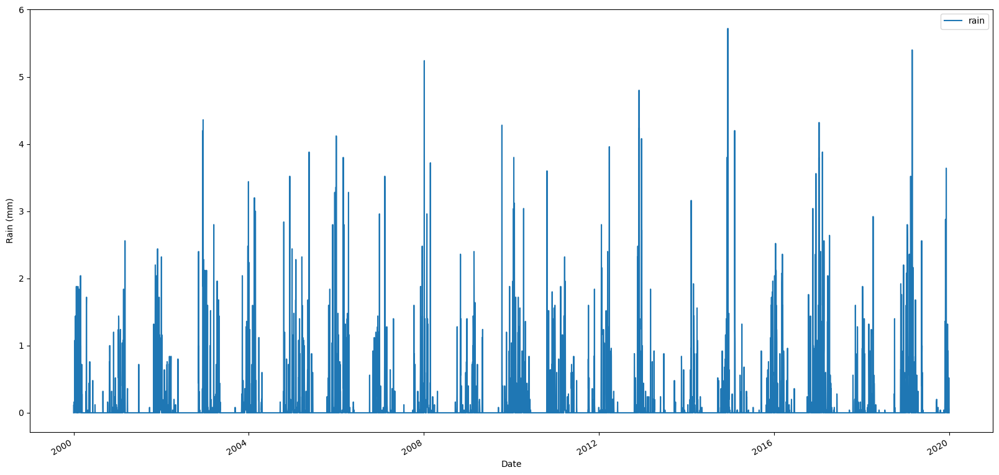

In [44]:
import matplotlib.pyplot as plot

fig, ax = plot.subplots(figsize=(20,10)) 

df_rain_test_CA_pd_daily_test_gauge.plot(x = 'Date', y = 'rain', ax = ax) 

ax.yaxis.set_label_position("left")
            
ax.set_ylabel("Rain (mm)")

plot.show()
            

In [13]:
#What are the 100 largest rainfall events in these gauges?

hundredlargest = df_rain_test_CA_pd.groupby('station_code').apply(lambda x: x.nlargest(n = 100, columns= ['rain']))

In [20]:
#To inspect in spreadsheets

hundredlargest.to_csv('100largest.csv')





In [16]:
rain_test_CA_daily_df=rain_test_CA_daily.to_frame()


rain_test_CA_monthly_df=rain_test_CA_monthly.to_frame()

In [17]:
# Biggest difference between consecutive days.

# df.diff - consecutive rows. must have same station code


rain_test_CA_daily_df['rain_change_daily'] = rain_test_CA_daily_df.groupby('station_code')['rain'].diff()


# Biggest difference between consecutive months.


rain_test_CA_monthly_df['rain_change_monthly'] = rain_test_CA_monthly_df.groupby('station_code')['rain'].diff()




In [18]:
# Output to csv for inspection.

rain_test_CA_monthly_df.to_csv('rain_change_monthly.csv')

In [19]:
print(rain_test_CA_monthly_df)

                          rain  rain_change_monthly
year month station_code                            
2000 1     BNVC1         10.29                  NaN
           CICC1          5.79                  NaN
           CLUC1          0.00                  NaN
           FBLC1          0.00                  NaN
           LBIC1          4.44                  NaN
...                        ...                  ...
2019 12    SMF            5.51                 5.20
           SWIC1          4.24                 3.68
           TCRC1          4.04                 3.20
           WEEC1          1.75                 1.74
           YRKC1         14.16                12.24

[5465 rows x 2 columns]


Now to read in the actual groundwater data 

In [46]:
os.chdir("..")

os.chdir("..")

os.chdir("..")

os.chdir("..")

os.chdir("..")

os.chdir("..")

os.chdir("home")

os.chdir("jcody")

os.chdir("Documents")

os.chdir("gw_project")

os.chdir("gw_data")

## Here the directory was changed to the folder with the groundwater data .csv


print(os.listdir())

gw_well_data = pd.read_csv('gwl-daily.csv')

['Fig4_2.png', 'Fig1.png', 'gwl-monthly.csv', 'well_distance_check.csv', 'Fig4.png', 'Fig5.png', 'hundredlargestwells.csv', 'gwl-daily.csv', 'largestwells.csv', 'gwl-daily.csv.zip', 'Fig3_2.png', 'gwl-monthly.csv.zip', 'rain_gauge_US_Cal_chk.csv', 'gwl-stations.csv', 'closest_rain.csv', 'Fig1_2.png', 'SO_timeshift.png', 'Fig3.png', 'WL_change_daily.csv', 'uscities.csv', 'Fig2.png', 'Fig5_2.png', 'gwl-quality_codes.csv', 'checkanswers.csv', 'distances_check.csv', 'Fig2_2.png']


In [47]:
# print (gw_well_data)

# WSE  Water Surface Elevation in feet above Mean Sea Level 


gw_well_data['daily_change']= gw_well_data.groupby('STATION')['WSE'].diff()





In [48]:
# Check df stats

gw_well_data.info()



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048575 entries, 0 to 1048574
Data columns (total 13 columns):
 #   Column        Non-Null Count    Dtype  
---  ------        --------------    -----  
 0   STATION       1048575 non-null  object 
 1   MSMT_DATE     1048575 non-null  object 
 2   WLM_RPE       1042002 non-null  float64
 3   WLM_RPE_QC    1048575 non-null  int64  
 4   WLM_GSE       1039724 non-null  float64
 5   WLM_GSE_QC    1048575 non-null  int64  
 6   RPE_WSE       963223 non-null   float64
 7   RPE_WSE_QC    1048575 non-null  int64  
 8   GSE_WSE       954445 non-null   float64
 9   GSE_WSE_QC    1048575 non-null  int64  
 10  WSE           956650 non-null   float64
 11  WSE_QC        1048575 non-null  int64  
 12  daily_change  954704 non-null   float64
dtypes: float64(6), int64(5), object(2)
memory usage: 104.0+ MB


View gw well data headers

In [49]:
print(gw_well_data)

               STATION   MSMT_DATE  WLM_RPE  WLM_RPE_QC  WLM_GSE  WLM_GSE_QC  \
0        14N01E35P001M  12/27/2022   48.740           1   46.880           1   
1        14N01E35P004M  12/27/2022   47.620           1   46.880           1   
2        16N03W14H004M  12/27/2022   68.210           1   65.700           1   
3        14N01E35P001M  12/26/2022   48.740           1   46.880           1   
4        14N01E35P004M  12/26/2022   47.620           1   46.880           1   
...                ...         ...      ...         ...      ...         ...   
1048570  09N03E08C004M   3/26/1992   32.056           2   30.016           2   
1048571  09N03E08C001M   3/25/1992   30.386           2   30.016           2   
1048572  09N03E08C002M   3/25/1992   30.226           2   30.016           2   
1048573  09N03E08C003M   3/25/1992   30.186           2   30.016           2   
1048574  09N03E08C004M   3/25/1992   32.056           2   30.016           2   

         RPE_WSE  RPE_WSE_QC  GSE_WSE  

### Exploratory data visualisation

Let's view the data for a single well as a line chart, to see what we are dealing with.

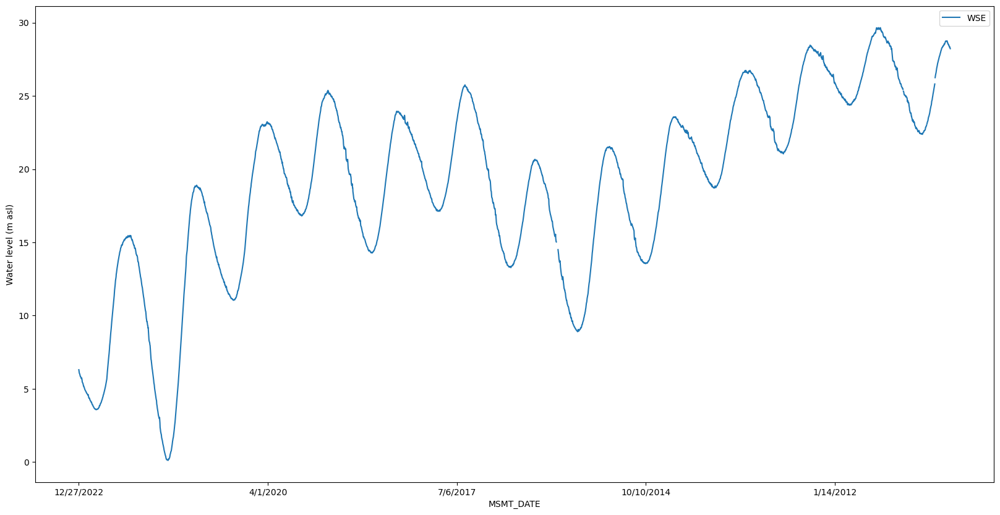

In [51]:


gw_well_data_single_well=gw_well_data[gw_well_data["STATION"]=='14N01E35P001M']



fig, ax = plot.subplots(figsize=(20,10)) 

gw_well_data_single_well.plot(x = 'MSMT_DATE', y = 'WSE', ax = ax) 

ax.yaxis.set_label_position("left")
            
ax.set_ylabel("Water level (m asl)")

plot.show()
            
            

In [24]:
#What are the largest water level changes in these wells?

largestwellchanges=[]

largestwellchanges = gw_well_data.groupby('STATION').apply(lambda x: x.nlargest(n = 10000, columns= ['daily_change']))

In [25]:
#Output to csv for inspection

largestwellchanges.to_csv('largestwells.csv')


In [26]:

#List the well changes

largestwellchangesm = largestwellchanges.iloc[:,1:]



# Add the codes for the four closest rain gauges to the list of the largest daily well changes.



largestwellchangesmr = pd.merge(largestwellchangesm, outcheck_T, on=[('STATION')], how="inner")



largestwellchangesmr = largestwellchangesmr.sort_values('daily_change', ascending=False)



largestwellchangesmr.info()




<class 'pandas.core.frame.DataFrame'>
Index: 1039845 entries, 01N04E36Q001M to 19N01W22D004M
Data columns (total 16 columns):
 #   Column        Non-Null Count    Dtype  
---  ------        --------------    -----  
 0   MSMT_DATE     1039845 non-null  object 
 1   WLM_RPE       1033272 non-null  float64
 2   WLM_RPE_QC    1039845 non-null  int64  
 3   WLM_GSE       1030994 non-null  float64
 4   WLM_GSE_QC    1039845 non-null  int64  
 5   RPE_WSE       959129 non-null   float64
 6   RPE_WSE_QC    1039845 non-null  int64  
 7   GSE_WSE       950351 non-null   float64
 8   GSE_WSE_QC    1039845 non-null  int64  
 9   WSE           952556 non-null   float64
 10  WSE_QC        1039845 non-null  int64  
 11  daily_change  950759 non-null   float64
 12  1st           1039845 non-null  object 
 13  2nd           1039845 non-null  object 
 14  3rd           1039845 non-null  object 
 15  4th           1039845 non-null  object 
dtypes: float64(6), int64(5), object(5)
memory usage: 134.9+ MB


In [27]:
#Turn the date to datetime format

largestwellchangesmr['MSMT_DATE'] = largestwellchangesmr['MSMT_DATE'].astype('datetime64')

largestwellchangesmr.info()



<class 'pandas.core.frame.DataFrame'>
Index: 1039845 entries, 01N04E36Q001M to 19N01W22D004M
Data columns (total 16 columns):
 #   Column        Non-Null Count    Dtype         
---  ------        --------------    -----         
 0   MSMT_DATE     1039845 non-null  datetime64[ns]
 1   WLM_RPE       1033272 non-null  float64       
 2   WLM_RPE_QC    1039845 non-null  int64         
 3   WLM_GSE       1030994 non-null  float64       
 4   WLM_GSE_QC    1039845 non-null  int64         
 5   RPE_WSE       959129 non-null   float64       
 6   RPE_WSE_QC    1039845 non-null  int64         
 7   GSE_WSE       950351 non-null   float64       
 8   GSE_WSE_QC    1039845 non-null  int64         
 9   WSE           952556 non-null   float64       
 10  WSE_QC        1039845 non-null  int64         
 11  daily_change  950759 non-null   float64       
 12  1st           1039845 non-null  object        
 13  2nd           1039845 non-null  object        
 14  3rd           1039845 non-null  objec

In [28]:

#How many unique wells are there for the largest water level changes?

print(largestwellchangesmr.index.unique)


<bound method Index.unique of Index(['01N04E36Q001M', '16N02W05B004M', '16N02W05B004M', '07N02E35D003M',
       '16N02W05B004M', '01N04E36Q001M', '13N04E11J001M', '16N02W05B004M',
       '17N02W09H005M', '13N04E11J001M',
       ...
       '19N01W22D004M', '19N01W22D004M', '19N01W22D004M', '19N01W22D004M',
       '19N01W22D004M', '19N01W22D004M', '19N01W22D004M', '19N01W22D004M',
       '19N01W22D004M', '19N01W22D004M'],
      dtype='object', name='STATION', length=1039845)>


In [29]:
print(largestwellchangesmr.columns)

Index(['MSMT_DATE', 'WLM_RPE', 'WLM_RPE_QC', 'WLM_GSE', 'WLM_GSE_QC',
       'RPE_WSE', 'RPE_WSE_QC', 'GSE_WSE', 'GSE_WSE_QC', 'WSE', 'WSE_QC',
       'daily_change', '1st', '2nd', '3rd', '4th'],
      dtype='object')


In [30]:
# Turn index into well column.
largestwellchangesmr['well'] = largestwellchangesmr.index




In [31]:
print(len(largestwellchangesmr))

# Remove non-unique well entries

largestwellchangesmrsh=largestwellchangesmr.drop_duplicates(subset=['well'])

print(len(largestwellchangesmrsh))


1039845
238


In [32]:
#Create dataframe for WL and rain data

largestwellchangesmrsh['DATE_init_tracking'] ='2010-01-01'

largestwellchangesmrsh['DATE_end_tracking'] ='2019-12-31'



largestwellsexp=pd.concat([pd.DataFrame({'Date': pd.date_range(row.DATE_init_tracking, row.DATE_end_tracking, freq='D'),
               'well': row['well'],'First': row['1st'],'Second': row['2nd'],'Third': row['3rd'],'Fourth': row['4th']
                        }, columns=['Date','well','First','Second','Third','Fourth']) 
           for i, row in largestwellchangesmrsh.iterrows()])

/tmp/ipykernel_1661/4167423151.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  largestwellchangesmrsh['DATE_init_tracking'] ='2010-01-01'
/tmp/ipykernel_1661/4167423151.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  largestwellchangesmrsh['DATE_end_tracking'] ='2019-12-31'


In [33]:
# Merge 

gw_well_data.rename(columns={'STATION':'well'}, inplace=True)

gw_well_data.rename(columns={'MSMT_DATE':'Date'}, inplace=True)


gw_well_data['Date'] = gw_well_data['Date'].astype('datetime64')

largestwellsexp_dat=largestwellsexp.merge(gw_well_data, on=['well', 'Date'], how='left')

print(largestwellsexp_dat)




             Date           well  First Second  Third Fourth  WLM_RPE  \
0      2010-01-01  01N04E36Q001M  VITC1  MTYC1  JTRC1  OCIC1     10.3   
1      2010-01-02  01N04E36Q001M  VITC1  MTYC1  JTRC1  OCIC1     10.3   
2      2010-01-03  01N04E36Q001M  VITC1  MTYC1  JTRC1  OCIC1     10.3   
3      2010-01-04  01N04E36Q001M  VITC1  MTYC1  JTRC1  OCIC1     10.3   
4      2010-01-05  01N04E36Q001M  VITC1  MTYC1  JTRC1  OCIC1     10.3   
...           ...            ...    ...    ...    ...    ...      ...   
869171 2019-12-27  04N04E34N002M  MKJC1  AAAC1  OSJC1  GGSC1      NaN   
869172 2019-12-28  04N04E34N002M  MKJC1  AAAC1  OSJC1  GGSC1      NaN   
869173 2019-12-29  04N04E34N002M  MKJC1  AAAC1  OSJC1  GGSC1      NaN   
869174 2019-12-30  04N04E34N002M  MKJC1  AAAC1  OSJC1  GGSC1      NaN   
869175 2019-12-31  04N04E34N002M  MKJC1  AAAC1  OSJC1  GGSC1      NaN   

        WLM_RPE_QC  WLM_GSE  WLM_GSE_QC  RPE_WSE  RPE_WSE_QC  GSE_WSE  \
0              1.0      6.9         1.0   18.292  

In [34]:
# Reset index to get useable columns in rain data DF

rain_test_CA_daily_df_mod = rain_test_CA_daily_df.reset_index()
print(rain_test_CA_daily_df_mod)

rain_test_CA_daily_df_mod['Date']=pd.to_datetime(rain_test_CA_daily_df_mod[['year','month','day']])




        year  month  day station_code  rain  rain_change_daily
0       2000      1    1        BNVC1  0.01                NaN
1       2000      1    1        CICC1  0.00                NaN
2       2000      1    1        CLUC1  0.00                NaN
3       2000      1    1        FBLC1  0.00                NaN
4       2000      1    1        LBIC1  0.00                NaN
...      ...    ...  ...          ...   ...                ...
161083  2019     12   31          SMF  0.00              -0.13
161084  2019     12   31        SWIC1  0.00              -0.08
161085  2019     12   31        TCRC1  0.00              -0.08
161086  2019     12   31        WEEC1  0.00               0.00
161087  2019     12   31        YRKC1  0.00              -0.08

[161088 rows x 6 columns]


In [35]:
#Drop excess date columns

rain_test_CA_daily_df_mod = rain_test_CA_daily_df_mod.drop(['year','month','day'], axis=1)

print(rain_test_CA_daily_df_mod)


       station_code  rain  rain_change_daily       Date
0             BNVC1  0.01                NaN 2000-01-01
1             CICC1  0.00                NaN 2000-01-01
2             CLUC1  0.00                NaN 2000-01-01
3             FBLC1  0.00                NaN 2000-01-01
4             LBIC1  0.00                NaN 2000-01-01
...             ...   ...                ...        ...
161083          SMF  0.00              -0.13 2019-12-31
161084        SWIC1  0.00              -0.08 2019-12-31
161085        TCRC1  0.00              -0.08 2019-12-31
161086        WEEC1  0.00               0.00 2019-12-31
161087        YRKC1  0.00              -0.08 2019-12-31

[161088 rows x 4 columns]


In [36]:
# Assign columns for four closest rain gauges.

rain_test_CA_daily_df_mod = rain_test_CA_daily_df_mod.drop(['rain_change_daily'], axis=1)

rain_test_CA_daily_df_mod['First'] = rain_test_CA_daily_df_mod['station_code']

rain_test_CA_daily_df_mod['Second'] = rain_test_CA_daily_df_mod['station_code']

rain_test_CA_daily_df_mod['Third'] = rain_test_CA_daily_df_mod['station_code']

rain_test_CA_daily_df_mod['Fourth'] = rain_test_CA_daily_df_mod['station_code']



In [37]:
# Merge groundwater data and rainfall data.

largestwellsexp_datf=largestwellsexp_dat.merge(rain_test_CA_daily_df_mod, on=['Date', 'First'], how='left')

# Add data for closest rain gauge.

largestwellsexp_datf['First_rain'] = largestwellsexp_datf['rain']

largestwellsexp_datf['Second'] = largestwellsexp_datf['Second_x']

largestwellsexp_datf['Third'] = largestwellsexp_datf['Third_x']

largestwellsexp_datf['Fourth'] = largestwellsexp_datf['Fourth_x']

largestwellsexp_datf = largestwellsexp_datf[['Date', 'well','First','First_rain','Second','Third','Fourth','WLM_RPE', 'WLM_RPE_QC', 'WLM_GSE',
       'WLM_GSE_QC', 'RPE_WSE', 'RPE_WSE_QC', 'GSE_WSE', 'GSE_WSE_QC', 'WSE',
       'WSE_QC']]


print('Data added for closest rain gauge')

Data added for closest rain gauge


In [38]:
# Merge groundwater data and rainfall data.


largestwellsexp_dats=largestwellsexp_datf.merge(rain_test_CA_daily_df_mod, on=['Date', 'Second'], how='left')

# Add data for second closest rain gauge.

largestwellsexp_dats['Second_rain'] = largestwellsexp_dats['rain']

largestwellsexp_dats['First'] = largestwellsexp_dats['First_x']

largestwellsexp_dats['Third'] = largestwellsexp_dats['Third_x']

largestwellsexp_dats['Fourth'] = largestwellsexp_dats['Fourth_x']

largestwellsexp_dats = largestwellsexp_dats[['Date', 'well','First','First_rain','Second','Second_rain','Third','Fourth','WLM_RPE', 'WLM_RPE_QC', 'WLM_GSE',
       'WLM_GSE_QC', 'RPE_WSE', 'RPE_WSE_QC', 'GSE_WSE', 'GSE_WSE_QC', 'WSE',
       'WSE_QC']]


print('Data added for second closest rain gauge')

Data added for second closest rain gauge


In [39]:

# Merge groundwater data and rainfall data.


largestwellsexp_datt=largestwellsexp_dats.merge(rain_test_CA_daily_df_mod, on=['Date', 'Third'], how='left')

# Add data for third closest rain gauge.

largestwellsexp_datt['Third_rain'] = largestwellsexp_datt['rain']

largestwellsexp_datt['First'] = largestwellsexp_datt['First_x']

largestwellsexp_datt['Second'] = largestwellsexp_datt['Second_x']

largestwellsexp_datt['Fourth'] = largestwellsexp_datt['Fourth_x']

largestwellsexp_datt = largestwellsexp_datt[['Date', 'well','First','First_rain','Second','Second_rain','Third','Third_rain','Fourth','WLM_RPE', 'WLM_RPE_QC', 'WLM_GSE',
       'WLM_GSE_QC', 'RPE_WSE', 'RPE_WSE_QC', 'GSE_WSE', 'GSE_WSE_QC', 'WSE',
       'WSE_QC']]


print('Data added for third closest rain gauge')

Data added for third closest rain gauge


In [40]:
# Merge groundwater data and rainfall data.

largestwellsexp_datf=largestwellsexp_datt.merge(rain_test_CA_daily_df_mod, on=['Date', 'Fourth'], how='left')

# Add data for fourth closest rain gauge.

largestwellsexp_datf['Third'] = largestwellsexp_datf['Third_x']

largestwellsexp_datf['First'] = largestwellsexp_datf['First_x']

largestwellsexp_datf['Second'] = largestwellsexp_datf['Second_x']

largestwellsexp_datf['Fourth_rain'] = largestwellsexp_datf['rain']

largestwellsexp_datf = largestwellsexp_datf[['Date', 'well','First','First_rain','Second','Second_rain','Third','Third_rain','Fourth','Fourth_rain','WLM_RPE', 'WLM_RPE_QC', 'WLM_GSE',
       'WLM_GSE_QC', 'RPE_WSE', 'RPE_WSE_QC', 'GSE_WSE', 'GSE_WSE_QC', 'WSE',
       'WSE_QC']]

print('Data added for fourth closest rain gauge')

Data added for fourth closest rain gauge


In [41]:
#Shorten name

lwlfull=largestwellsexp_datf

In [42]:
# Examine largest rainfall events, month by month.

rain_test_CA_monthly_df_sort=rain_test_CA_monthly_df.sort_values(by=['rain_change_monthly'], ascending=False)


rain_test_CA_monthly_df_top=rain_test_CA_monthly_df_sort.head(10000)

print(rain_test_CA_monthly_df_top)


rain_test_CA_monthly_df_top = rain_test_CA_monthly_df_top.reset_index()  

rain_test_CA_monthly_df_top['station_code'].unique()


                          rain  rain_change_monthly
year month station_code                            
2003 1     MHRC1         96.35                60.43
2002 11    MHRC1         39.43                35.44
     12    YRKC1         27.72                22.08
2005 12    YRKC1         27.52                21.96
2003 3     GRIC1         21.20                20.90
...                        ...                  ...
2006 10    DCWC1          0.00                  NaN
     11    CYVC1          2.34                  NaN
2007 7     KBNC1          0.00                  NaN
2009 3     BWXC1          1.52                  NaN
2014 4     MWMC1         10.33                  NaN

[5465 rows x 2 columns]


array(['MHRC1', 'YRKC1', 'GRIC1', 'BNVC1', 'MOSC1', 'CICC1', 'BWXC1',
       'RDD', 'DVRC1', 'MDPC1', 'RRAC1', 'CRGC1', 'BRWC1', 'LBIC1',
       'DCWC1', 'OVE', 'MYV', 'SWIC1', 'TCRC1', 'SMF', 'MWMC1', 'CYVC1',
       'NWRC1', 'WEEC1', 'CLSC1', 'IDWC1', 'KBNC1', 'LKNC1', 'BKWC1',
       'DIXC1', 'DBHC1', 'TISC1', 'SACC1', 'CLUC1', 'CLAC1', 'CDNC1',
       'NCOC1', 'FBLC1', 'BJPC1', 'WLKC1', 'YUBC1', 'YOLC1', 'RMSC1',
       'VONC1'], dtype=object)

In [43]:
gauge_shortlist=rain_test_CA_monthly_df_top['station_code'].unique()


#These rain gauges experienced the largest rainfall events in that time period. Which are the closest wells and 
#did they see corresonding water level changes?

print(outcheck_T.columns)

print(outcheck_T)

Index(['1st', '2nd', '3rd', '4th'], dtype='object')
                 1st    2nd    3rd    4th
STATION                                  
01N04E36Q001M  VITC1  MTYC1  JTRC1  OCIC1
01N04E36Q002M  VITC1  MTYC1  JTRC1  OCIC1
01N04E36Q003M  VITC1  MTYC1  JTRC1  OCIC1
01N04E36Q004M  VITC1  MTYC1  JTRC1  OCIC1
01S04E28F001M  OBDC1  OADC1  CFNC1  WCIC1
...              ...    ...    ...    ...
48N05E14R001M  DBHC1  TULC1  KBNC1  CLIC1
48N05E16P001M  TULC1  DBHC1  KBNC1  LKNC1
48N05E25Q001M  DBHC1  TULC1  KBNC1  CLIC1
48N05E26D001M  DBHC1  TULC1  KBNC1  CLIC1
48N05E36A002M  DBHC1  TULC1  KBNC1  CLIC1

[551 rows x 4 columns]


In [44]:
#Reduce size of DF

gw_well_data_smaller_sum = gw_well_data.groupby('well')['WSE'].count()


gw_well_data_smaller_sum_df = pd.DataFrame(gw_well_data_smaller_sum)

gw_well_data_smaller_sum_df=gw_well_data_smaller_sum_df.sort_values(by=['WSE'])

gw_well_data_smaller_sum_df_short = gw_well_data_smaller_sum_df[gw_well_data_smaller_sum_df['WSE'] > 20] 

gw_well_data_smaller_sum_df_shortlist = gw_well_data_smaller_sum_df_short.index.tolist()


well_data_shortlist = gw_well_data[gw_well_data[['well']].isin(gw_well_data_smaller_sum_df_shortlist).any(axis=1)] 

print(len(gw_well_data_smaller_sum_df_shortlist))



231


In [45]:
# List these wells and corresponding rain gauges

station_gauge_list = outcheck_T.reset_index()  


print(station_gauge_list)


well_data_shortlist['STATION']=well_data_shortlist['well']



           STATION    1st    2nd    3rd    4th
0    01N04E36Q001M  VITC1  MTYC1  JTRC1  OCIC1
1    01N04E36Q002M  VITC1  MTYC1  JTRC1  OCIC1
2    01N04E36Q003M  VITC1  MTYC1  JTRC1  OCIC1
3    01N04E36Q004M  VITC1  MTYC1  JTRC1  OCIC1
4    01S04E28F001M  OBDC1  OADC1  CFNC1  WCIC1
..             ...    ...    ...    ...    ...
546  48N05E14R001M  DBHC1  TULC1  KBNC1  CLIC1
547  48N05E16P001M  TULC1  DBHC1  KBNC1  LKNC1
548  48N05E25Q001M  DBHC1  TULC1  KBNC1  CLIC1
549  48N05E26D001M  DBHC1  TULC1  KBNC1  CLIC1
550  48N05E36A002M  DBHC1  TULC1  KBNC1  CLIC1

[551 rows x 5 columns]


/tmp/ipykernel_1661/1631150488.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  well_data_shortlist['STATION']=well_data_shortlist['well']


In [46]:
#Add the closest rain gauges to the shortlisted well data.

well_data_shortlist_rain = pd.merge(well_data_shortlist, station_gauge_list, on=[('STATION')], how="inner")

well_plot_list=well_data_shortlist_rain['well'].unique()


print(well_data_shortlist_rain['Date'].min()) 
print(well_data_shortlist_rain['Date'].max()) 

print(len(well_data_shortlist_rain))

1992-03-25 00:00:00
2022-12-27 00:00:00
1042002


In [47]:
#If date later than 2019-12-31, delete. Rain and WL data should cover the same date range.


mask = (well_data_shortlist_rain['Date'] > '1999-12-31') & (well_data_shortlist_rain['Date'] <= '2019-12-31')

well_data_shortlist_rain = well_data_shortlist_rain.loc[mask]


print(len(well_data_shortlist_rain))

print(well_data_shortlist_rain['Date'].min()) 
print(well_data_shortlist_rain['Date'].max()) 


847582
2000-01-01 00:00:00
2019-12-31 00:00:00


In [48]:
#Rename columns to make it easier to address them

well_data_shortlist_rain = well_data_shortlist_rain.rename(columns={'1st': 'First', '2nd': 'Second', '3rd': 'Third', '4th': 'Fourth'})

print(well_data_shortlist_rain)



                  well       Date  WLM_RPE  WLM_RPE_QC  WLM_GSE  WLM_GSE_QC  \
1092     14N01E35P001M 2019-12-31    48.74           1    46.88           1   
1093     14N01E35P001M 2019-12-30    48.74           1    46.88           1   
1094     14N01E35P001M 2019-12-29    48.74           1    46.88           1   
1095     14N01E35P001M 2019-12-28    48.74           1    46.88           1   
1096     14N01E35P001M 2019-12-27    48.74           1    46.88           1   
...                ...        ...      ...         ...      ...         ...   
1041997  16N03E36M001M 2004-09-19    67.30           1    68.00           1   
1041998  16N03E36M001M 2004-09-18    67.30           1    68.00           1   
1041999  16N03E36M001M 2004-09-17    67.30           1    68.00           1   
1042000  16N03E36M001M 2004-09-16    67.30           1    68.00           1   
1042001  16N03E36M001M 2004-09-15    67.30           1    68.00           1   

         RPE_WSE  RPE_WSE_QC  GSE_WSE  GSE_WSE_QC  

In [49]:
print(rain_test_CA_daily_df_mod.columns)

Index(['station_code', 'rain', 'Date', 'First', 'Second', 'Third', 'Fourth'], dtype='object')


In [50]:
#New well data shortlist created. Add rainfall data (1)

well_data_shortlist_rain = well_data_shortlist_rain.merge(rain_test_CA_daily_df_mod, on=['Date', 'First'], how='left')


well_data_shortlist_rain['First_rain'] = well_data_shortlist_rain['rain']

well_data_shortlist_rain['Second'] = well_data_shortlist_rain['Second_x']

well_data_shortlist_rain['Third'] = well_data_shortlist_rain['Third_x']

well_data_shortlist_rain['Fourth'] = well_data_shortlist_rain['Fourth_x']

well_data_shortlist_rain = well_data_shortlist_rain[['Date', 'well','First','First_rain','Second','Third','Fourth','WSE'
    ]]

print("First rain gauge added")


First rain gauge added


In [51]:
#Add rainfall data (2)

well_data_shortlist_rain = well_data_shortlist_rain.merge(rain_test_CA_daily_df_mod, on=['Date', 'Second'], how='left')


well_data_shortlist_rain['Second_rain'] = well_data_shortlist_rain['rain']

well_data_shortlist_rain['First'] = well_data_shortlist_rain['First_x']

well_data_shortlist_rain['Third'] = well_data_shortlist_rain['Third_x']

well_data_shortlist_rain['Fourth'] = well_data_shortlist_rain['Fourth_x']

well_data_shortlist_rain = well_data_shortlist_rain[['Date', 'well','First','First_rain','Second','Second_rain','Third','Fourth','WSE']]


print("Second rain gauge added")

Second rain gauge added


In [52]:
#Add rainfall data (3)



well_data_shortlist_rain = well_data_shortlist_rain.merge(rain_test_CA_daily_df_mod, on=['Date', 'Third'], how='left')

well_data_shortlist_rain['Third_rain'] = well_data_shortlist_rain['rain']

well_data_shortlist_rain['First'] = well_data_shortlist_rain['First_x']

well_data_shortlist_rain['Second'] = well_data_shortlist_rain['Second_x']

well_data_shortlist_rain['Fourth'] = well_data_shortlist_rain['Fourth_x']

well_data_shortlist_rain = well_data_shortlist_rain[['Date', 'well','First','First_rain','Second','Second_rain','Third','Third_rain','Fourth', 'WSE']]


print("Third rain gauge added")

Third rain gauge added


In [53]:
#Add rainfall data (4)

well_data_shortlist_rain = well_data_shortlist_rain.merge(rain_test_CA_daily_df_mod, on=['Date', 'Fourth'], how='left')


well_data_shortlist_rain['Fourth_rain'] = well_data_shortlist_rain['rain']

well_data_shortlist_rain['First'] = well_data_shortlist_rain['First_x']

well_data_shortlist_rain['Second'] = well_data_shortlist_rain['Second_x']

well_data_shortlist_rain['Third'] = well_data_shortlist_rain['Third_x']

well_data_shortlist_rain = well_data_shortlist_rain[['Date', 'well','First','First_rain','Second','Second_rain','Third','Third_rain','Fourth','Fourth_rain','WSE']]

print("Fourth rain gauge added")

Fourth rain gauge added


In [54]:
#Create shorter list of wells

gw_well_data_smaller=gw_well_data[['well','Date','WSE']]

gw_well_data_smaller_sum = gw_well_data_smaller.groupby('well')['WSE'].count()

#gw_well_data_smaller_sum.info()

gw_well_data_smaller_sum_df = pd.DataFrame(gw_well_data_smaller_sum)

gw_well_data_smaller_sum_df=gw_well_data_smaller_sum_df.sort_values(by=['WSE'])




Do a trial run plotting water levels and rain data.

In [ ]:
import matplotlib.pyplot as plot

for indwell in well_plot_list:
    print(indwell)
    indwelldata = well_data_shortlist_rain[ well_data_shortlist_rain['well'] == indwell]
    fig, ax = plot.subplots(figsize=(20,10)) 
    indwelldata.plot(x = 'Date', y = 'WSE', ax = ax) 
    indwelldata.plot(x = 'Date', y = ['First_rain','Second_rain','Third_rain','Fourth_rain'], ax = ax, secondary_y = True) 
    plot.show()


It is clear that while some charts contain suitable data, others should be filtered out. I will try filtering by the 
number of distinct rain measurements from the four closest rain gauges during the time period.

In [ ]:
#Remove well/ rain gauge sets with too few data points. Plot the good ones.

suitablewells=[]
counter=0
for indwell in well_plot_list:
    indwelldata = well_data_shortlist_rain[ well_data_shortlist_rain['well'] == indwell]
    ind_measurements= (indwelldata['First_rain'].nunique())+(indwelldata['Second_rain'].nunique())+(indwelldata['Third_rain'].nunique())+(indwelldata['Fourth_rain'].nunique())
    if ind_measurements > 50:
        print("well code:",indwell)
        print("number of rainfall measurements:", ind_measurements)
        counter=counter+1
        suitablewells.append(indwell)
        fig, ax = plot.subplots(figsize=(20,10)) 
        indwelldata.plot(x = 'Date', y = 'WSE', ax = ax) 
        indwelldata.plot(x = 'Date', y = ['First_rain','Second_rain','Third_rain','Fourth_rain'], ax = ax, secondary_y = True) 
        plot.show()

print("the total number of useful charts is",counter)
print("the total number of discarded charts is",len(well_plot_list) - counter)


Try to find the lag time between the rain and water level response.

Do a trial run with a single well as proof of concept. Use a rolling mean 

for both parameters to smooth out irregularities.


Most probable GW time lag from precipitation (in days) is 21


/tmp/ipykernel_1661/4096187047.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  indwelldatatest['avg_rain'] = indwelldatatest[['First_rain','Second_rain','Third_rain','Fourth_rain']].mean(axis=1)
/tmp/ipykernel_1661/4096187047.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  indwelldatatest['avg_rain_per_fortnight'] = indwelldatatest['avg_rain'].rolling(14).mean()
/tmp/ipykernel_1661/4096187047.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

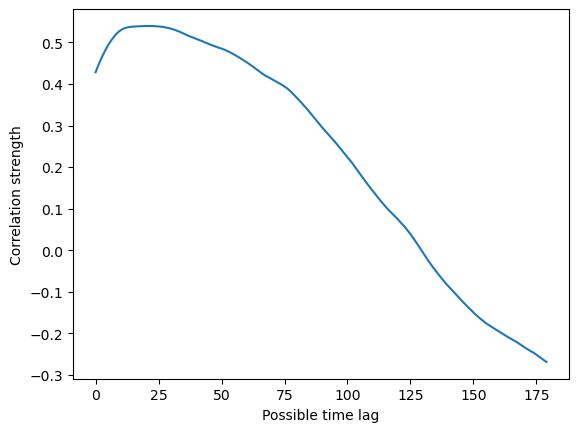

In [57]:


indwelldatatest = well_data_shortlist_rain[ well_data_shortlist_rain['well'] == '05N03E09L001M']


#Get average (if not null) of all four rain gauge columns

indwelldatatest['avg_rain'] = indwelldatatest[['First_rain','Second_rain','Third_rain','Fourth_rain']].mean(axis=1)

indwelldatatest['avg_rain_per_fortnight'] = indwelldatatest['avg_rain'].rolling(14).mean()

indwelldatatest['avg_WL_per_fortnight'] = indwelldatatest['WSE'].rolling(14).mean()

def rainWLcorr(rain_input, WL_input, timelag=0):
    """ Rain/WL cross correlation for timelag determination. 
    
    timelag : default 0, try a range of numbers
    
    rain_input: rain data
    WL_input: groundwater data
    
    the above two series should be of equal length
    

    rainWLcorr: correlation for possible lag times
    Peak is most probable time lag in given range
    
    """
    return rain_input.corr(WL_input.shift(timelag))

rain_input = indwelldatatest['avg_rain_per_fortnight']
WL_input = indwelldatatest['avg_WL_per_fortnight']


correlation_well_test = [rainWLcorr(rain_input, WL_input, timelag=i) for i in range(180)]

correlation_well_test_srs = pd.Series(correlation_well_test)

print("Most probable GW time lag from precipitation (in days) is", correlation_well_test_srs.idxmax()) 

plot.plot(correlation_well_test)


plot.xlabel("Possible time lag")
plot.ylabel("Correlation strength")

# Plot showing correlation strength for possible time lags.

plot.show()

It seems to work. Now to put all the elements together and find the time lags for the downselected wells.
Note that some of the previous charts did not have a very wide spread of rainfall data, so we should probably exclude those as well.

### Results

The following code outputs a series of line charts and text showing rainfall, groundwater response, and an estimate
for the time-lag together with the correlation coefficent for that estimated time-lag.

well code 14N01E35P001M has only 1 nearby rain data measurement[s]
well code 14N01E35P004M has only 1 nearby rain data measurement[s]
well code 16N03W14H004M has only 0 nearby rain data measurement[s]
well code 04N04E01N001M has only 0 nearby rain data measurement[s]
well code 04N04E02B001M has only 0 nearby rain data measurement[s]
well code 04N04E12M001M has only 0 nearby rain data measurement[s]
well code 04N04E12M002M has only 0 nearby rain data measurement[s]
well code 04N05E07N002M has only 0 nearby rain data measurement[s]
well code 05N04E36G001M has only 0 nearby rain data measurement[s]
well code 05N04E36G002M has only 0 nearby rain data measurement[s]
well code 05N05E30A004M has only 0 nearby rain data measurement[s]
well code 05N05E30K001M has only 0 nearby rain data measurement[s]
well code 05N05E30K002M has only 0 nearby rain data measurement[s]
well code 15N04E04R002M has only 1 nearby rain data measurement[s]
well code 15N04E04R003M has only 1 nearby rain data measuremen

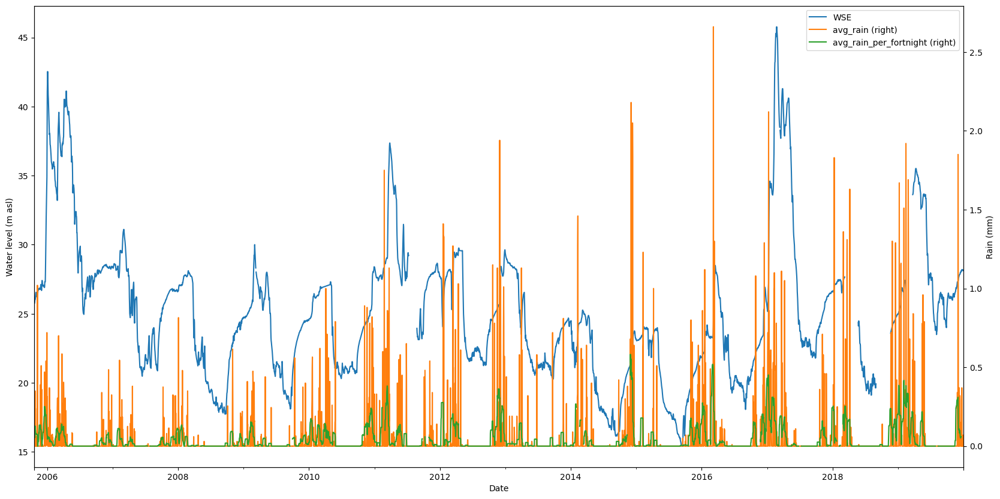

well code: 14N03E23D004M
closest rain gauges: FBLC1 MYV PUWC1 YUBC1
number of rainfall measurements: 161
time range of rainfall measurements (days): 5184
Most probable GW time lag from precipitation (in days) is 10


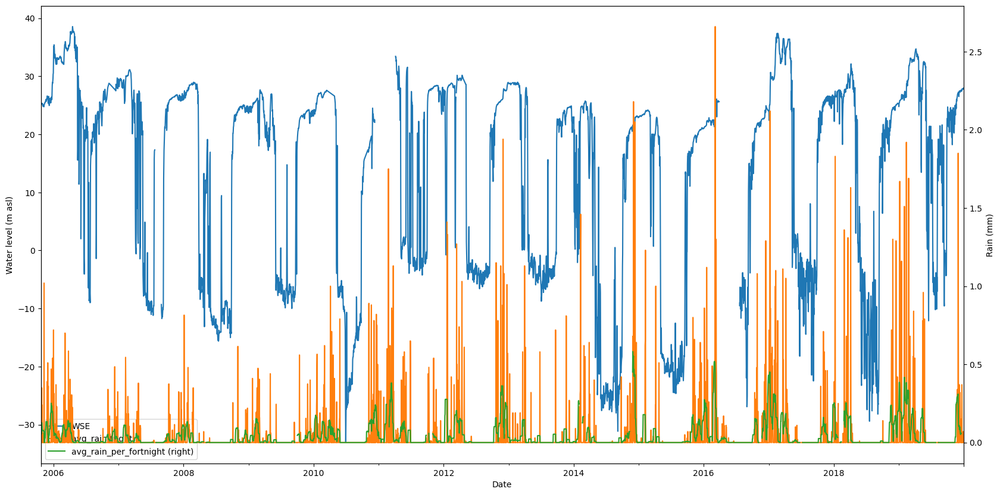

well code: 14N03E23D005M
closest rain gauges: FBLC1 MYV PUWC1 YUBC1
number of rainfall measurements: 161
time range of rainfall measurements (days): 5184
Most probable GW time lag from precipitation (in days) is 50


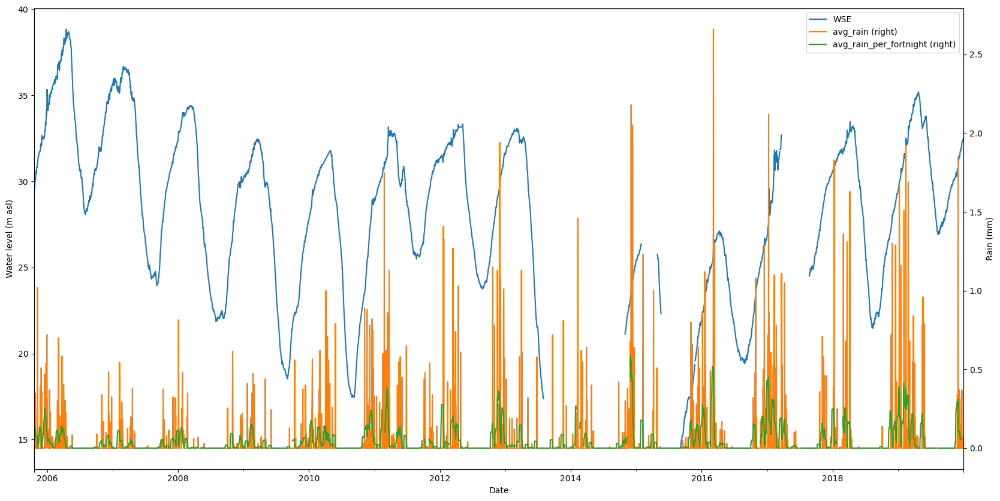

well code: 14N03E23D006M
closest rain gauges: FBLC1 MYV PUWC1 YUBC1
number of rainfall measurements: 161
time range of rainfall measurements (days): 5184
Most probable GW time lag from precipitation (in days) is 57


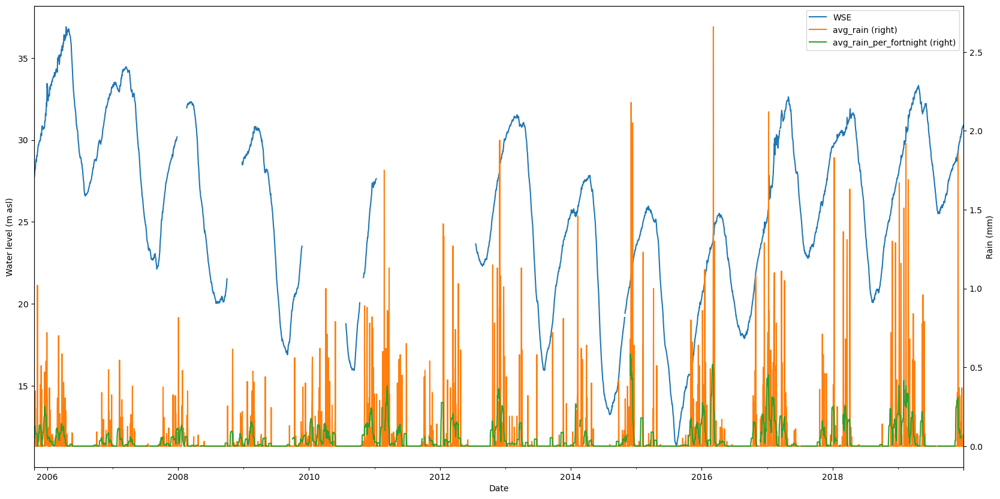

well code 16N03E17J001M has only 0 nearby rain data measurement[s]
well code 16N03E17J002M has only 0 nearby rain data measurement[s]
well code 16N03E17J003M has only 0 nearby rain data measurement[s]
well code 16N03E17J005M has only 0 nearby rain data measurement[s]
well code 15N04E04R005M has only 1 nearby rain data measurement[s]
well code: 07N02E35D001M
closest rain gauges: FFAC1 LBIC1 DAX CCSC1
number of rainfall measurements: 136
time range of rainfall measurements (days): 5442
Most probable GW time lag from precipitation (in days) is 94


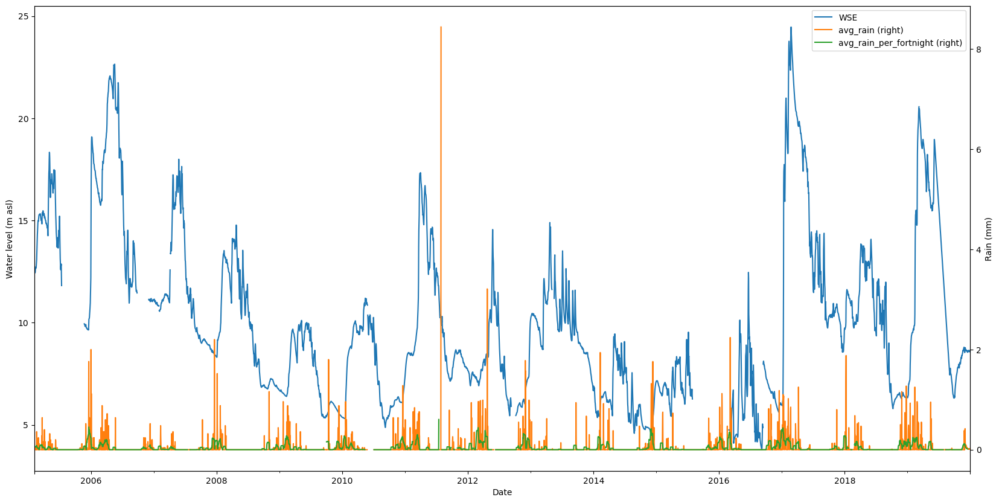

well code: 07N02E35D002M
closest rain gauges: FFAC1 LBIC1 DAX CCSC1
number of rainfall measurements: 136
time range of rainfall measurements (days): 5480
Most probable GW time lag from precipitation (in days) is 38


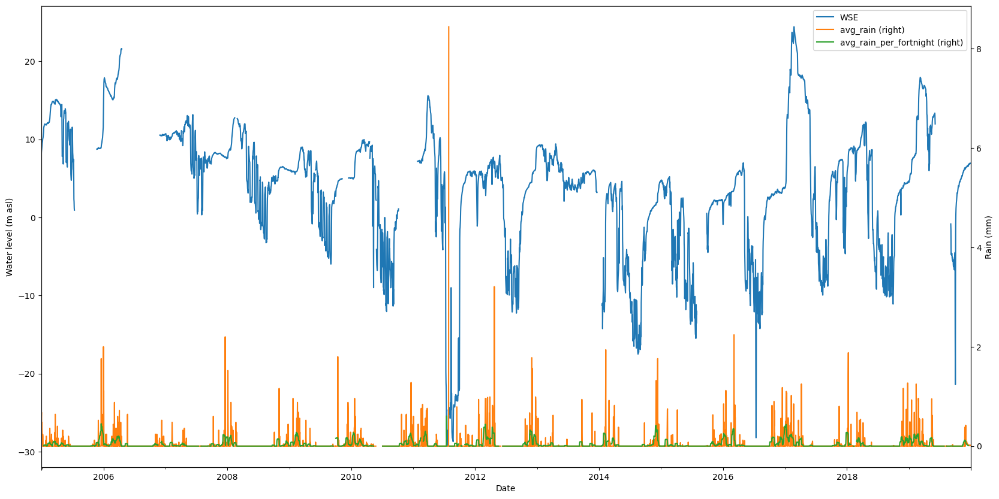

well code: 07N02E35D003M
closest rain gauges: FFAC1 LBIC1 DAX CCSC1
number of rainfall measurements: 136
time range of rainfall measurements (days): 5442
Most probable GW time lag from precipitation (in days) is 23


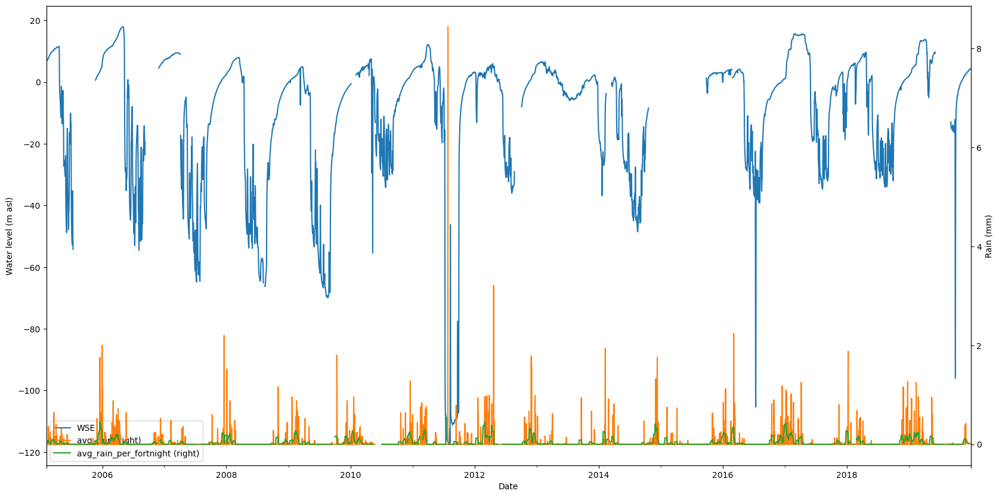

well code 09N04E20N001M has only 0 nearby rain data measurement[s]
well code 09N04E20N002M has only 0 nearby rain data measurement[s]
well code 11N04E04N001M has only 2 nearby rain data measurement[s]
well code 05N05E29D003M has only 0 nearby rain data measurement[s]
well code 16N02W05B001M has only 45 nearby rain data measurement[s]
well code 16N02W05B002M has only 45 nearby rain data measurement[s]
well code 16N02W05B003M has only 45 nearby rain data measurement[s]
well code: 09N03E08C002M
closest rain gauges: OTFC1 YOLC1 SMF SAPC1
number of rainfall measurements: 176
time range of rainfall measurements (days): 7304
Most probable GW time lag from precipitation (in days) is 25


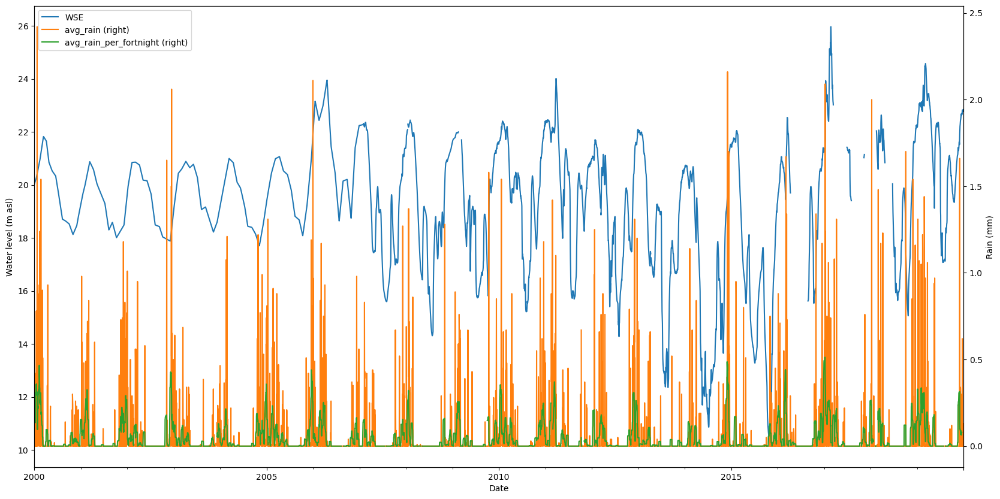

well code: 09N03E08C004M
closest rain gauges: OTFC1 YOLC1 SMF SAPC1
number of rainfall measurements: 176
time range of rainfall measurements (days): 7304
Most probable GW time lag from precipitation (in days) is 31


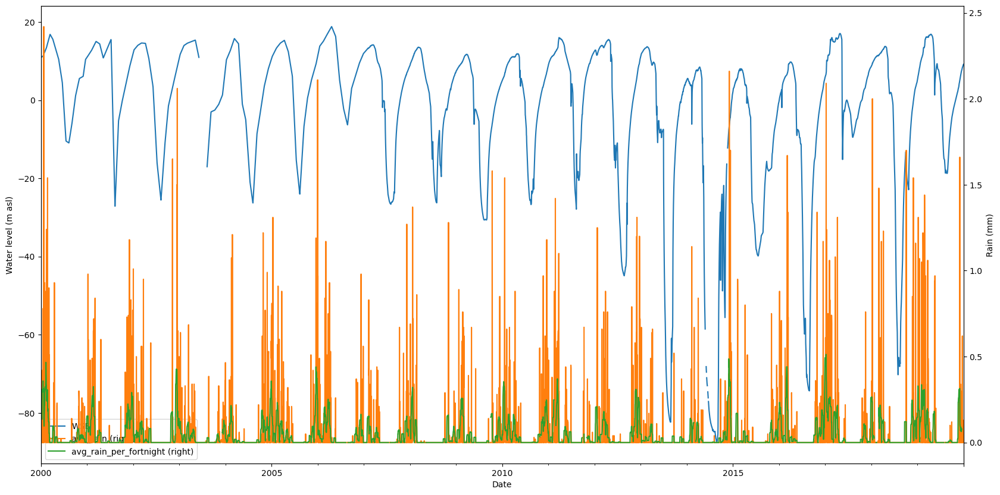

well code 11N01E24Q500M has only 0 nearby rain data measurement[s]
well code 11N01E24Q501M has only 0 nearby rain data measurement[s]
well code 11N01E24Q502M has only 0 nearby rain data measurement[s]
well code 11N01E24Q503M has only 0 nearby rain data measurement[s]
well code: 09N03E08C001M
closest rain gauges: OTFC1 YOLC1 SMF SAPC1
number of rainfall measurements: 176
time range of rainfall measurements (days): 7304
Most probable GW time lag from precipitation (in days) is 15


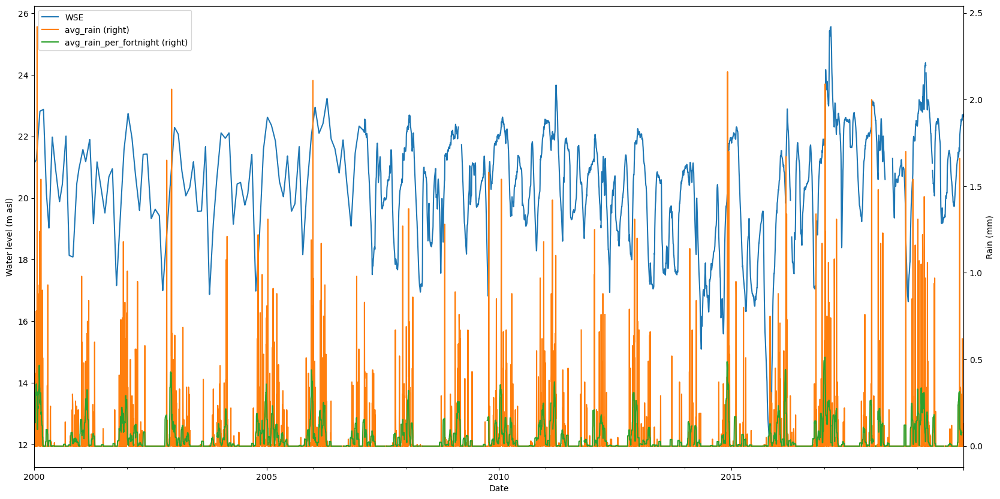

well code 11N01E02D001M has only 1 nearby rain data measurement[s]
well code 11N01E24Q004M has only 0 nearby rain data measurement[s]
well code 11N01E24Q005M has only 0 nearby rain data measurement[s]
well code 11N01E24Q006M has only 0 nearby rain data measurement[s]
well code 11N01E24Q007M has only 0 nearby rain data measurement[s]
well code 11N04E04N002M has only 2 nearby rain data measurement[s]
well code 11N04E04N003M has only 2 nearby rain data measurement[s]
well code 11N04E04N004M has only 2 nearby rain data measurement[s]
well code 12N01E07N001M has only 2 nearby rain data measurement[s]
well code 12N01E07N002M has only 2 nearby rain data measurement[s]
well code 12N01E07N003M has only 2 nearby rain data measurement[s]
well code 12N01E14R001M has only 2 nearby rain data measurement[s]
well code 12N01E14R002M has only 2 nearby rain data measurement[s]
well code 12N01E14R003M has only 2 nearby rain data measurement[s]
well code 12N01W04M001M has only 0 nearby rain data measuremen

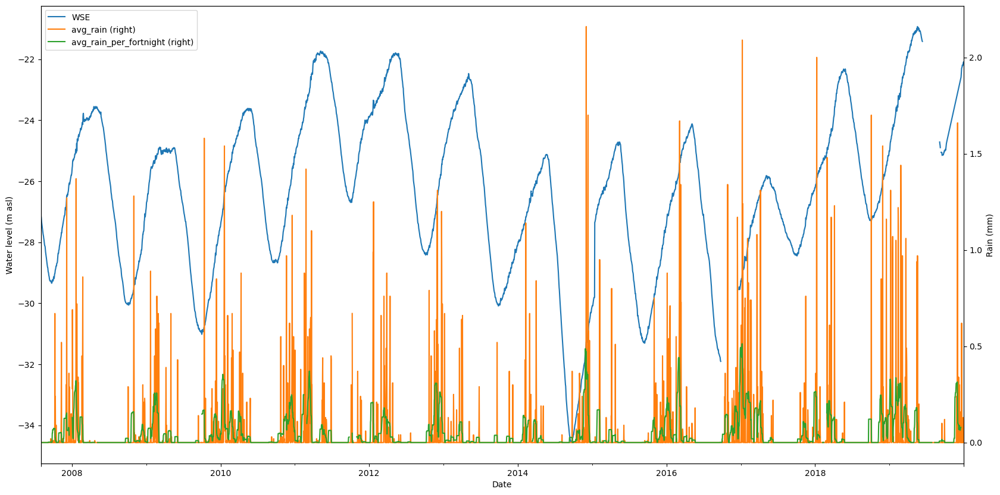

well code: 10N04E27R003M
closest rain gauges: SAPC1 NDCC1 DIVC1 SMF
number of rainfall measurements: 148
time range of rainfall measurements (days): 4534
Most probable GW time lag from precipitation (in days) is 38


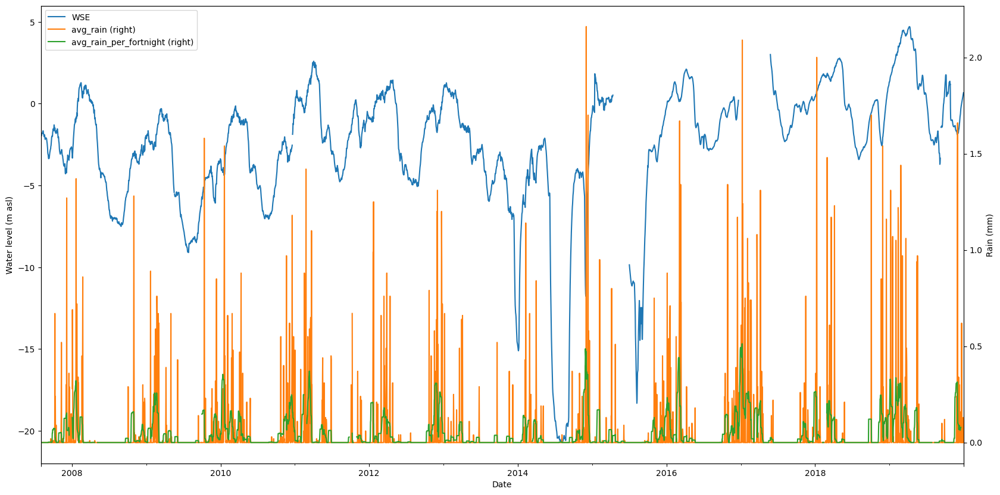

well code: 10N04E27R004M
closest rain gauges: SAPC1 NDCC1 DIVC1 SMF
number of rainfall measurements: 148
time range of rainfall measurements (days): 4534
Most probable GW time lag from precipitation (in days) is 150


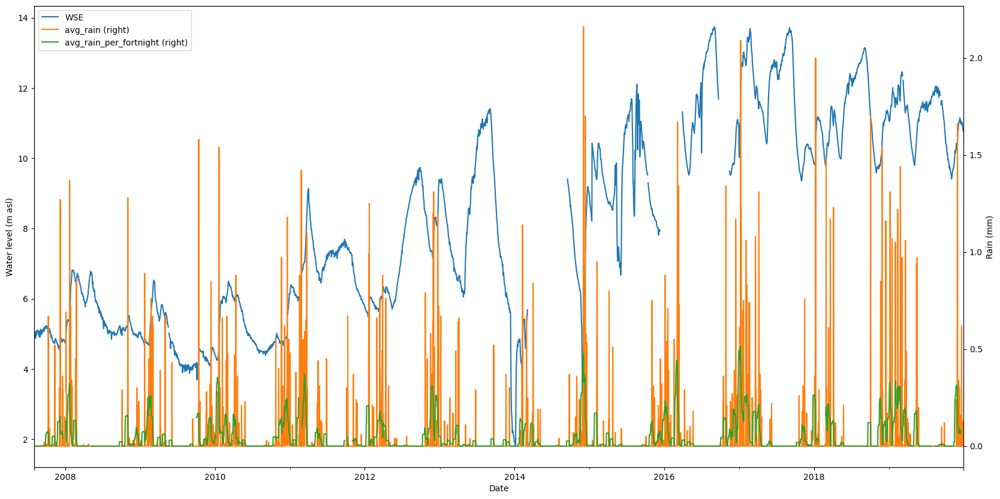

well code: 10N04E31M001M
closest rain gauges: SMF SAPC1 YOLC1 PDLC1
number of rainfall measurements: 149
time range of rainfall measurements (days): 4666
Most probable GW time lag from precipitation (in days) is 129


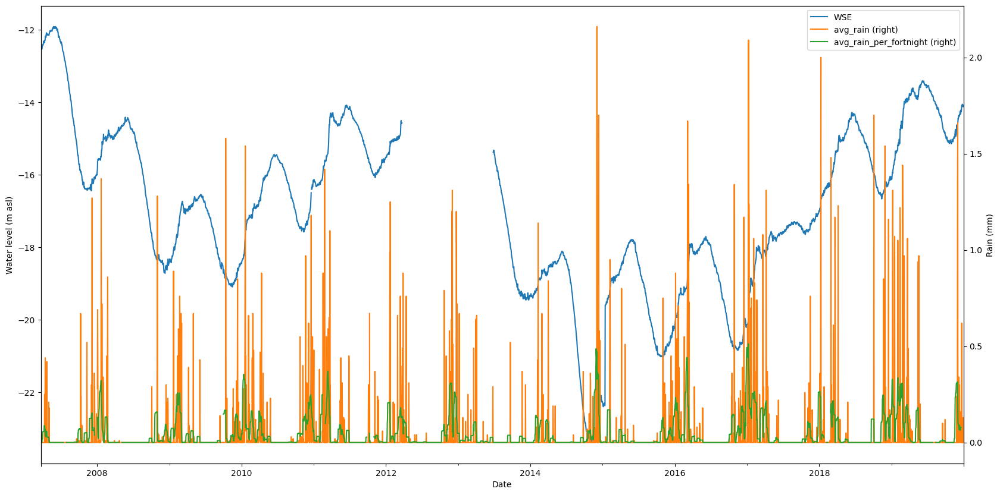

well code: 10N04E31M002M
closest rain gauges: SMF SAPC1 YOLC1 PDLC1
number of rainfall measurements: 149
time range of rainfall measurements (days): 4666
Most probable GW time lag from precipitation (in days) is 97


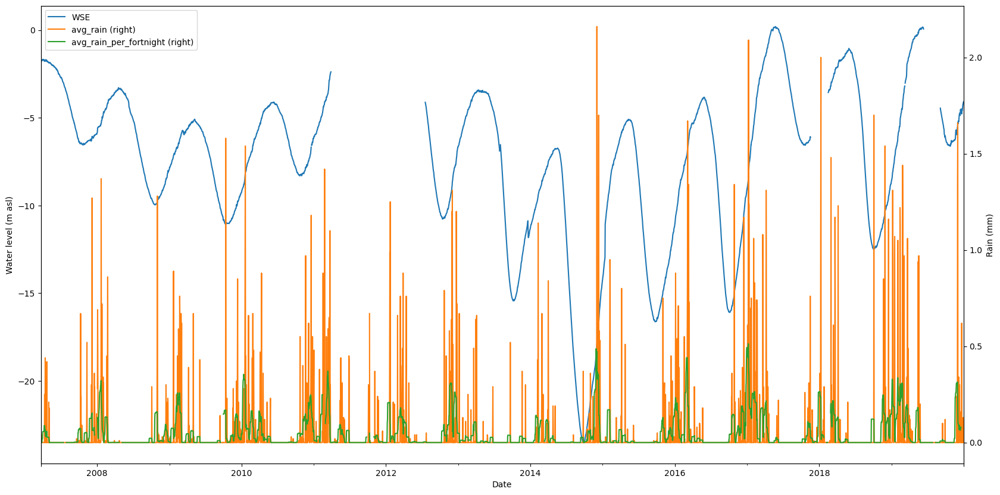

well code: 10N04E31M003M
closest rain gauges: SMF SAPC1 YOLC1 PDLC1
number of rainfall measurements: 149
time range of rainfall measurements (days): 4666
Most probable GW time lag from precipitation (in days) is 38


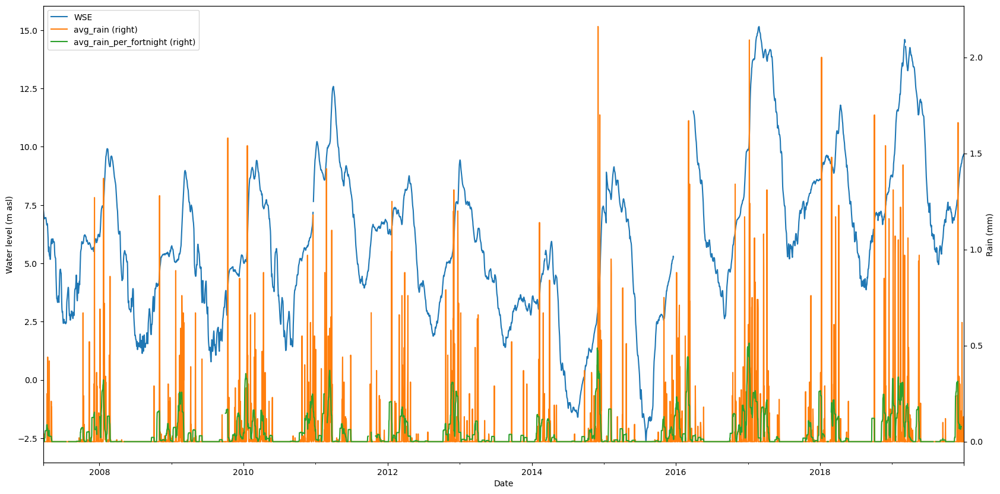

well code: 10N04E31M004M
closest rain gauges: SMF SAPC1 YOLC1 PDLC1
number of rainfall measurements: 149
time range of rainfall measurements (days): 4666
Most probable GW time lag from precipitation (in days) is 13


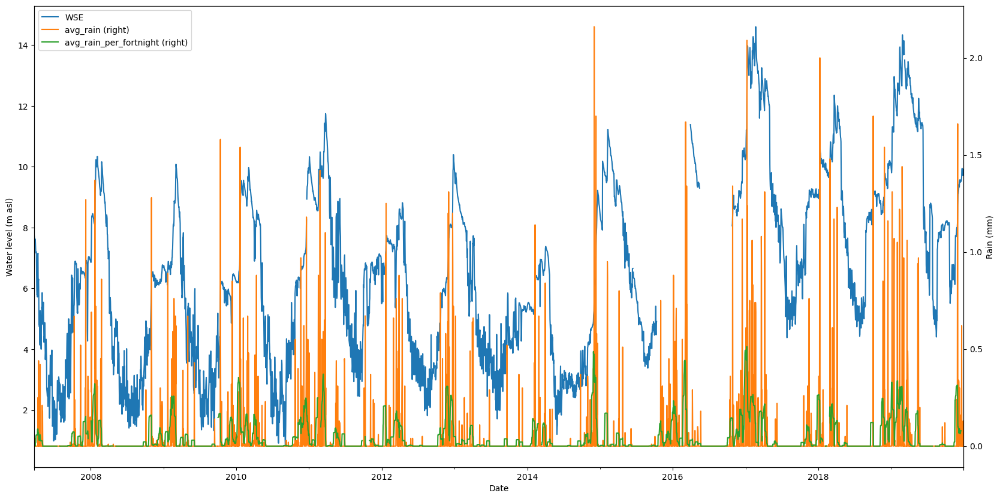

well code 12N04E03N001M has only 0 nearby rain data measurement[s]
well code 12N04E03N002M has only 0 nearby rain data measurement[s]
well code 12N04E03N003M has only 0 nearby rain data measurement[s]
well code 12N04E03N004M has only 0 nearby rain data measurement[s]
well code 12N04E26J002M has only 0 nearby rain data measurement[s]
well code 12N04E26J003M has only 0 nearby rain data measurement[s]
well code 12N04E26J004M has only 0 nearby rain data measurement[s]
well code: 13N04E11J001M
closest rain gauges: BPGC1 DCWC1 BRWC1 NICC1
number of rainfall measurements: 291
time range of rainfall measurements (days): 5108
Most probable GW time lag from precipitation (in days) is 23


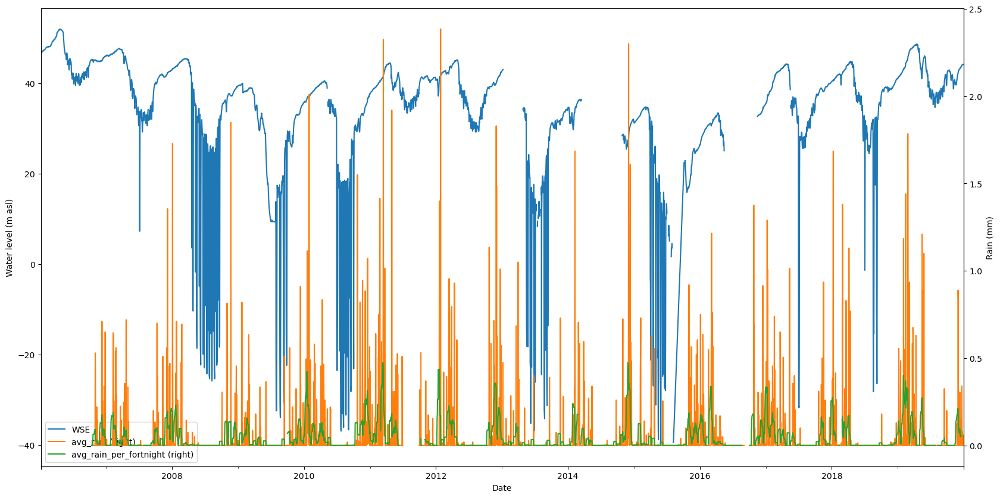

well code: 13N04E11R002M
closest rain gauges: BPGC1 DCWC1 BRWC1 NICC1
number of rainfall measurements: 291
time range of rainfall measurements (days): 6115
Most probable GW time lag from precipitation (in days) is 71


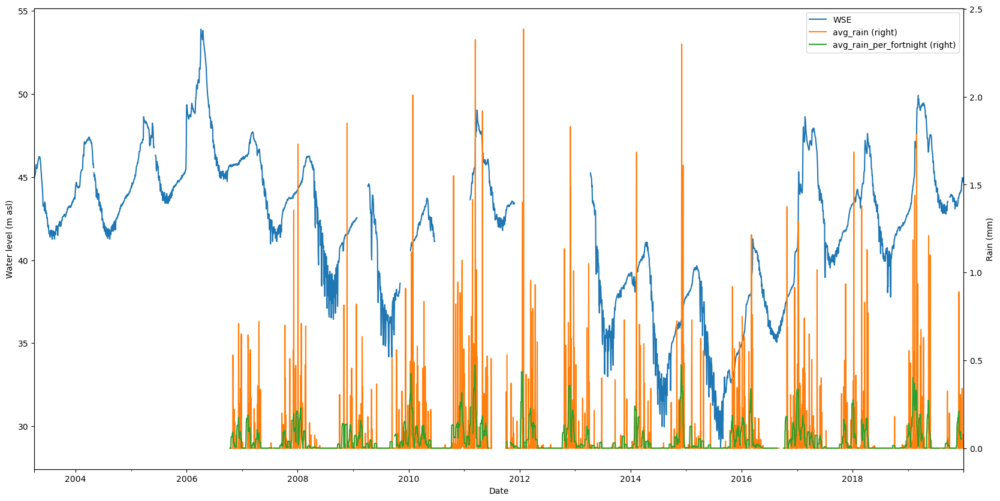

well code: 13N04E11R003M
closest rain gauges: BPGC1 DCWC1 BRWC1 NICC1
number of rainfall measurements: 291
time range of rainfall measurements (days): 6115
Most probable GW time lag from precipitation (in days) is 27


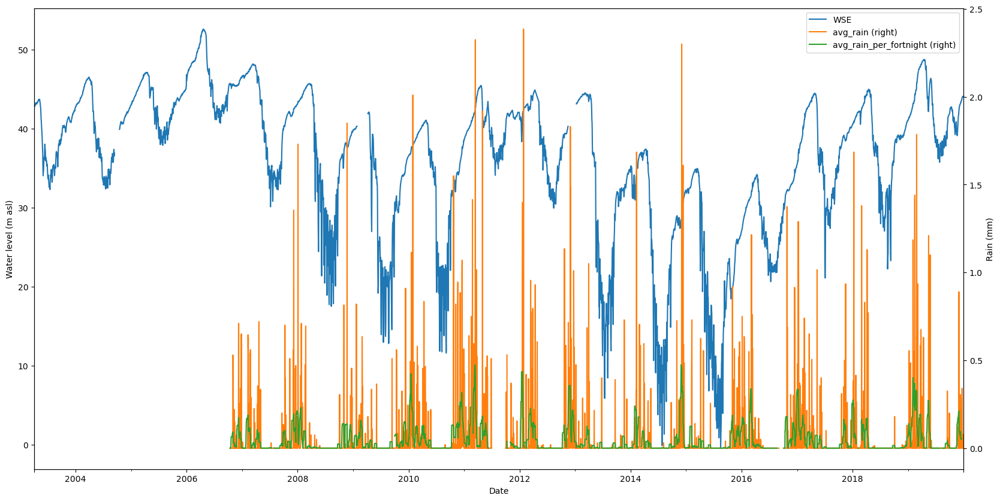

well code: 13N04E11R004M
closest rain gauges: BPGC1 DCWC1 BRWC1 NICC1
number of rainfall measurements: 291
time range of rainfall measurements (days): 6100
Most probable GW time lag from precipitation (in days) is 19


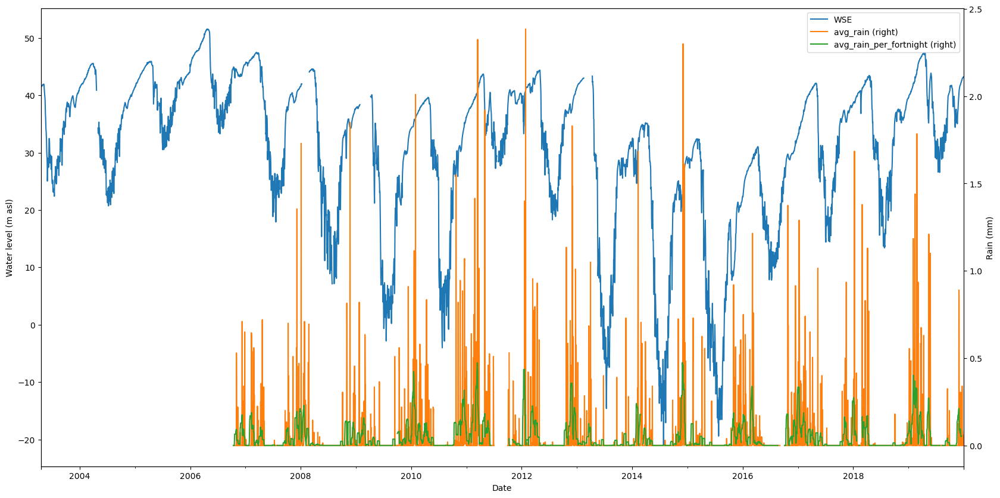

well code: 13N04E11R005M
closest rain gauges: BPGC1 DCWC1 BRWC1 NICC1
number of rainfall measurements: 291
time range of rainfall measurements (days): 6115
Most probable GW time lag from precipitation (in days) is 29


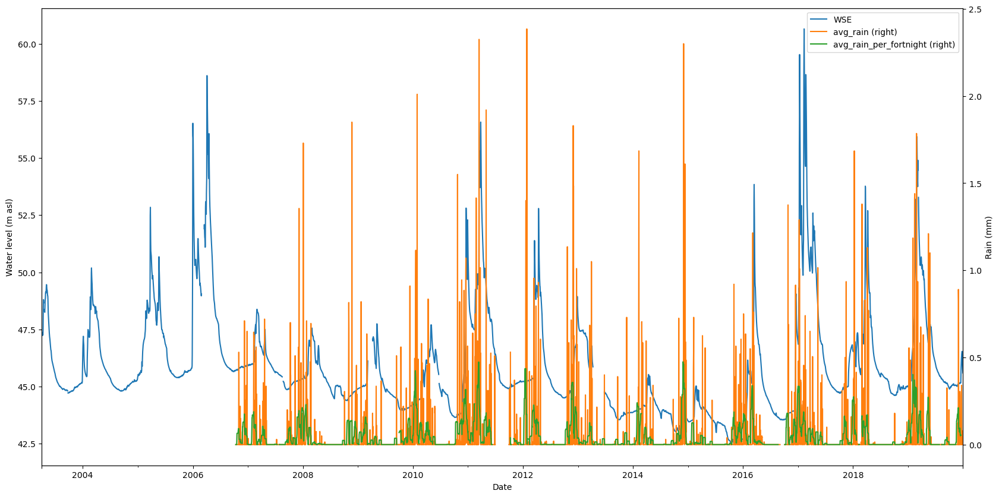

well code 18N01W02E001M has only 0 nearby rain data measurement[s]
well code 18N01W02E002M has only 0 nearby rain data measurement[s]
well code 12N02E23H001M has only 0 nearby rain data measurement[s]
well code 12N02E23H002M has only 0 nearby rain data measurement[s]
well code 12N02E23H003M has only 0 nearby rain data measurement[s]
well code 12N02E23H004M has only 0 nearby rain data measurement[s]
well code 13N01E24G002M has only 2 nearby rain data measurement[s]
well code 13N01E24G003M has only 2 nearby rain data measurement[s]
well code 13N01E24G004M has only 2 nearby rain data measurement[s]
well code 13N03E26J002M has only 0 nearby rain data measurement[s]
well code 13N03E26J003M has only 0 nearby rain data measurement[s]
well code 13N03E26J004M has only 0 nearby rain data measurement[s]
well code 13N03E26J005M has only 0 nearby rain data measurement[s]
well code 14N02E17C001M has only 1 nearby rain data measurement[s]
well code 14N02E17C002M has only 1 nearby rain data measuremen

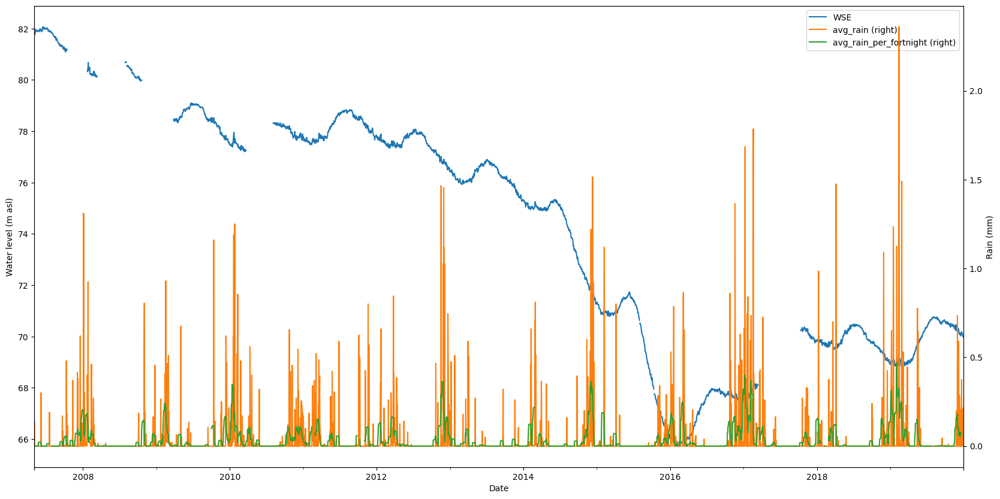

well code: 18N02W18D002M
closest rain gauges: NWRC1 BTCC1 CIOC1 CLSC1
number of rainfall measurements: 191
time range of rainfall measurements (days): 4625
Most probable GW time lag from precipitation (in days) is 87


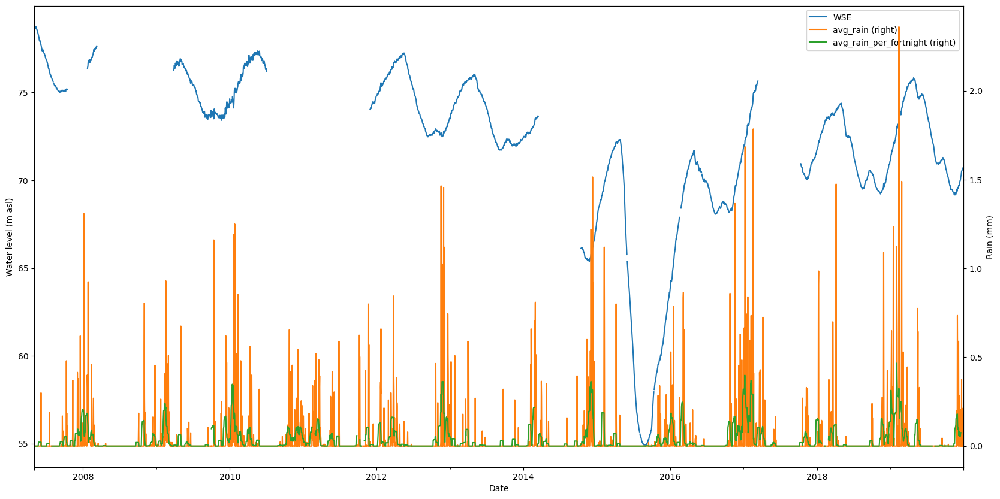

well code: 18N02W18D003M
closest rain gauges: NWRC1 BTCC1 CIOC1 CLSC1
number of rainfall measurements: 191
time range of rainfall measurements (days): 4625
Most probable GW time lag from precipitation (in days) is 55


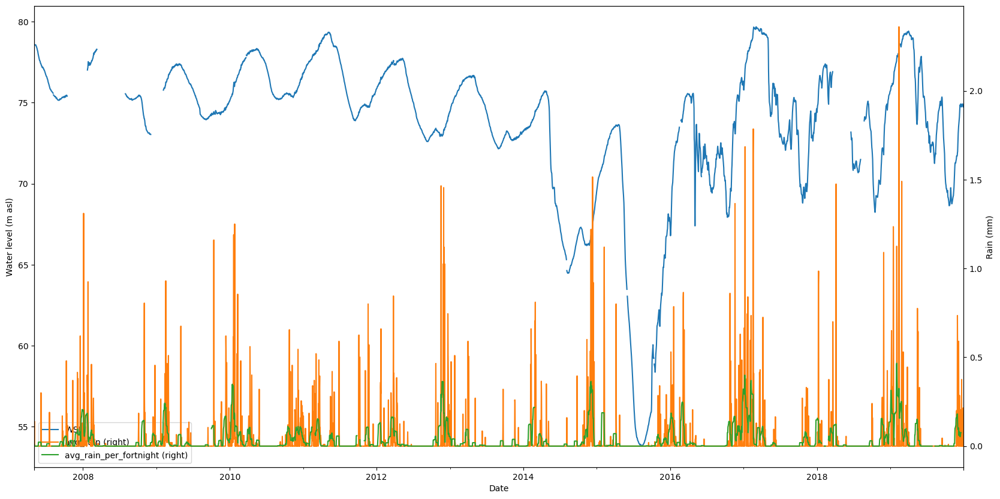

well code: 18N02W18D004M
closest rain gauges: NWRC1 BTCC1 CIOC1 CLSC1
number of rainfall measurements: 191
time range of rainfall measurements (days): 4625
Most probable GW time lag from precipitation (in days) is 16


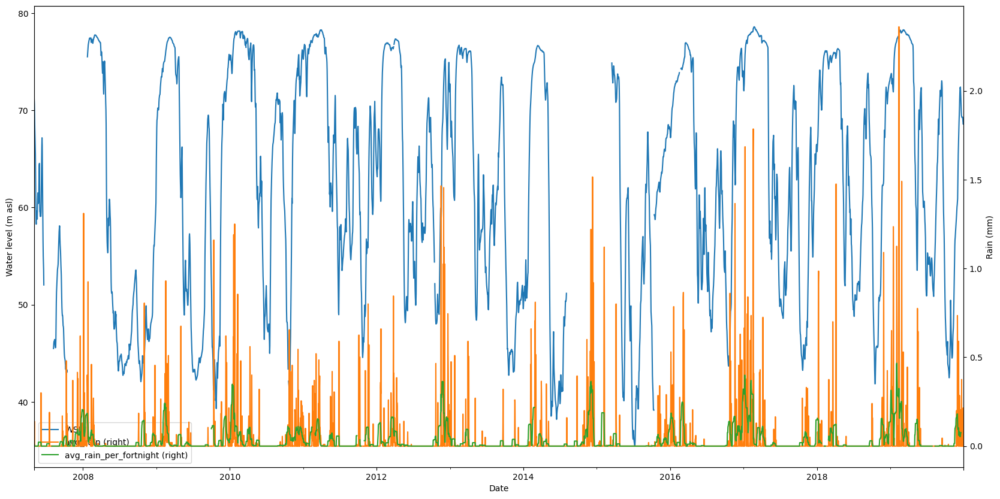

well code: 17N02W09H002M
closest rain gauges: CLSC1 NWRC1 CLAC1 BTCC1
number of rainfall measurements: 204
time range of rainfall measurements (days): 5435
Most probable GW time lag from precipitation (in days) is 53


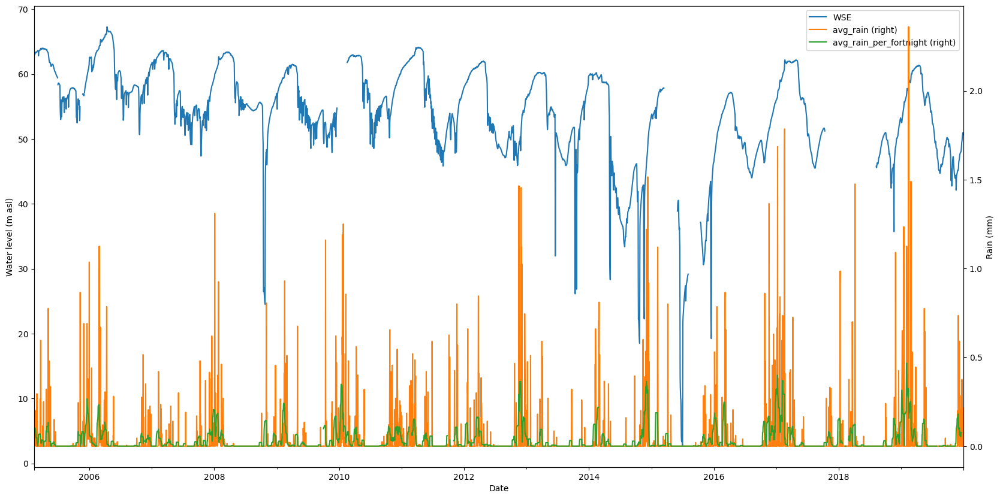

well code: 17N02W09H004M
closest rain gauges: CLSC1 NWRC1 CLAC1 BTCC1
number of rainfall measurements: 204
time range of rainfall measurements (days): 5435
Most probable GW time lag from precipitation (in days) is 19


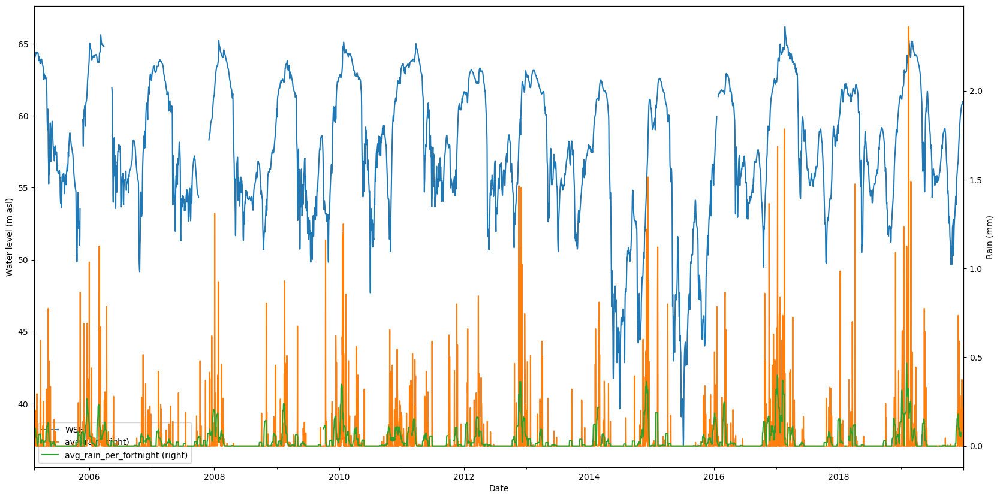

well code 19N01E35B002M has only 0 nearby rain data measurement[s]
well code 19N01E35B003M has only 0 nearby rain data measurement[s]
well code 17N01W10A001M has only 43 nearby rain data measurement[s]
well code 17N01W10A002M has only 43 nearby rain data measurement[s]
well code 17N01W10A003M has only 43 nearby rain data measurement[s]
well code 17N01W10A004M has only 43 nearby rain data measurement[s]
well code 17N01W27A001M has only 43 nearby rain data measurement[s]
well code 17N01W27A002M has only 43 nearby rain data measurement[s]
well code 17N01W27A003M has only 43 nearby rain data measurement[s]
well code 16N03W14H005M has only 0 nearby rain data measurement[s]
well code 16N03W14H006M has only 0 nearby rain data measurement[s]
well code 14N01E35P002M has only 1 nearby rain data measurement[s]
well code 14N01E35P003M has only 1 nearby rain data measurement[s]
well code 15N03W20Q001M has only 0 nearby rain data measurement[s]
well code 15N03W20Q002M has only 0 nearby rain data mea

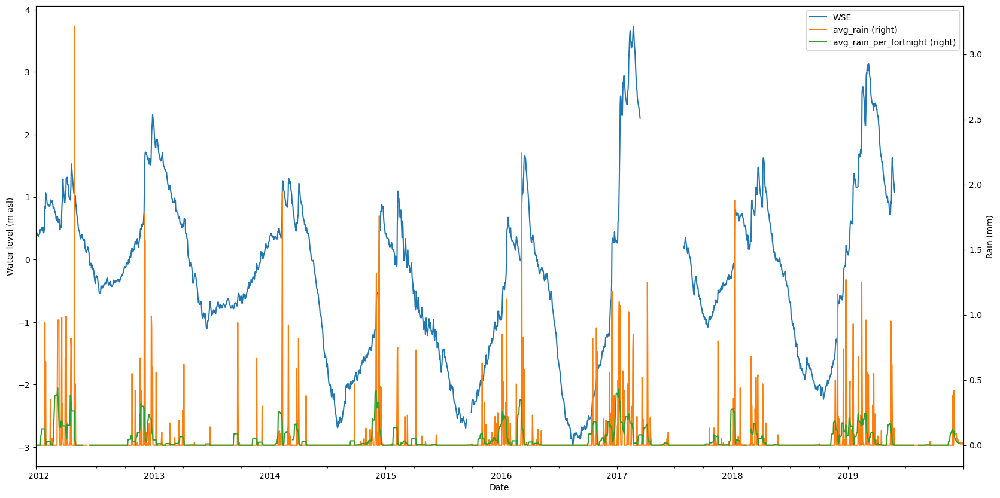

well code: 05N03E09L002M
closest rain gauges: SSZC1 LBIC1 CCSC1 WGSC1
number of rainfall measurements: 122
time range of rainfall measurements (days): 2930
Most probable GW time lag from precipitation (in days) is 21


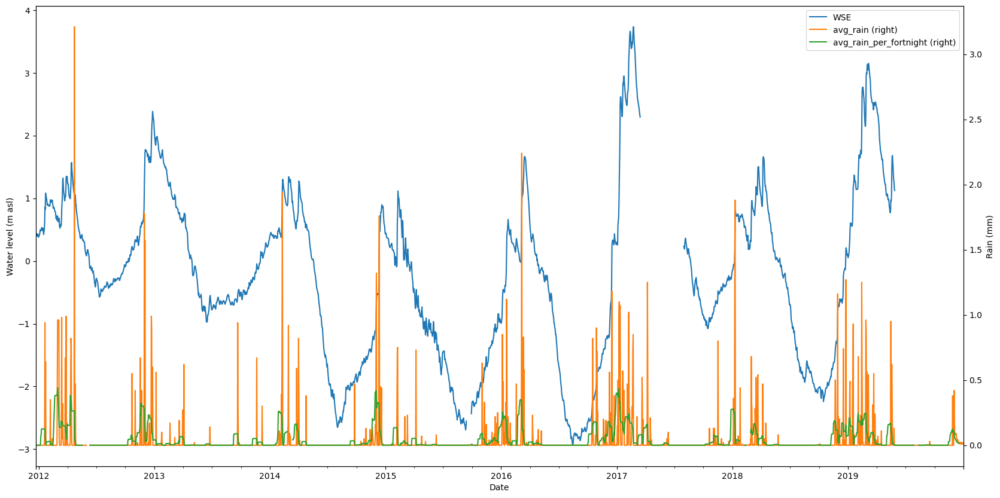

well code 18N01E35L001M has only 1 nearby rain data measurement[s]
well code 12N02E21Q001M has only 1 nearby rain data measurement[s]
well code 12N02E21Q002M has only 1 nearby rain data measurement[s]
well code 12N02E21Q003M has only 1 nearby rain data measurement[s]
well code 13N01E22A001M has only 2 nearby rain data measurement[s]
well code: 05N03E16B001M
closest rain gauges: SSZC1 LBIC1 CCSC1 GGSC1
number of rainfall measurements: 122
time range of rainfall measurements (days): 2930
Most probable GW time lag from precipitation (in days) is 10


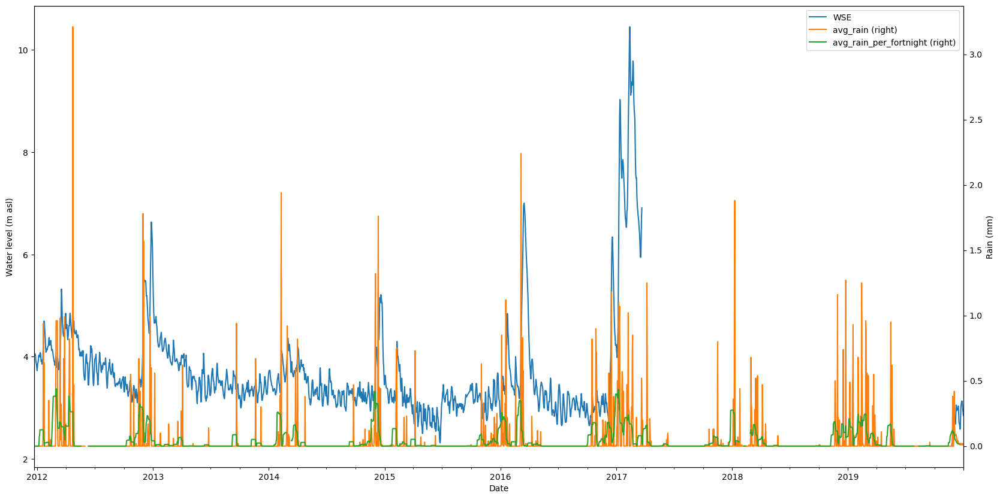

well code: 05N03E16B002M
closest rain gauges: SSZC1 LBIC1 CCSC1 GGSC1
number of rainfall measurements: 122
time range of rainfall measurements (days): 2930
Most probable GW time lag from precipitation (in days) is 13


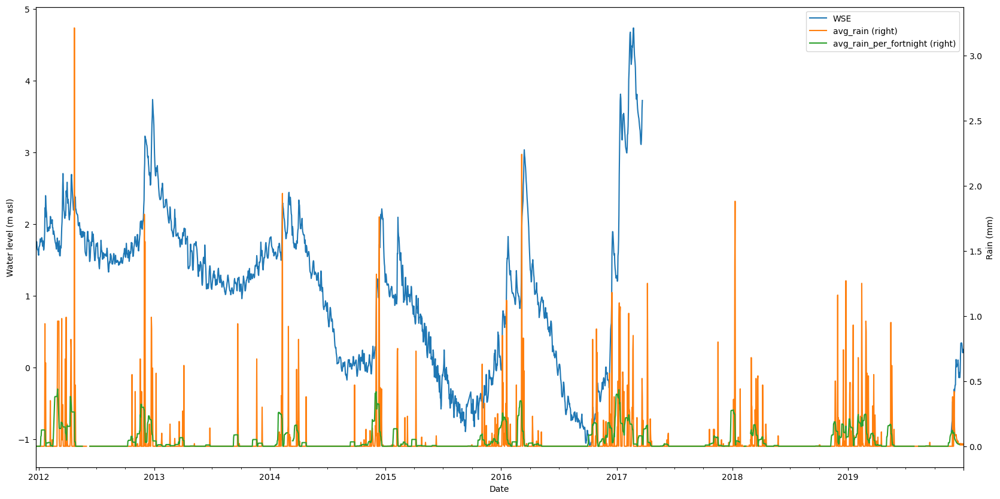

well code: 05N03E16H001M
closest rain gauges: SSZC1 LBIC1 CCSC1 GGSC1
number of rainfall measurements: 122
time range of rainfall measurements (days): 2930
Most probable GW time lag from precipitation (in days) is 70


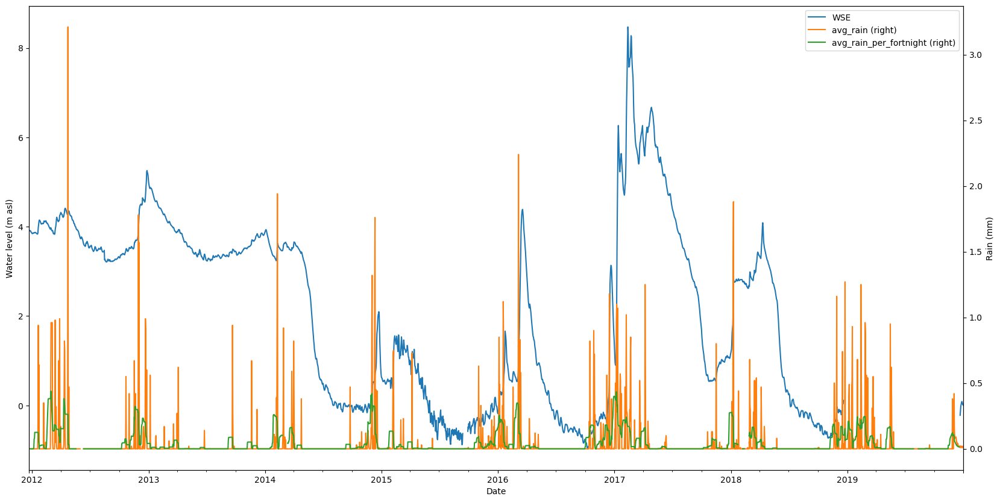

well code: 05N03E16H002M
closest rain gauges: SSZC1 LBIC1 CCSC1 GGSC1
number of rainfall measurements: 122
time range of rainfall measurements (days): 2930
Most probable GW time lag from precipitation (in days) is 11


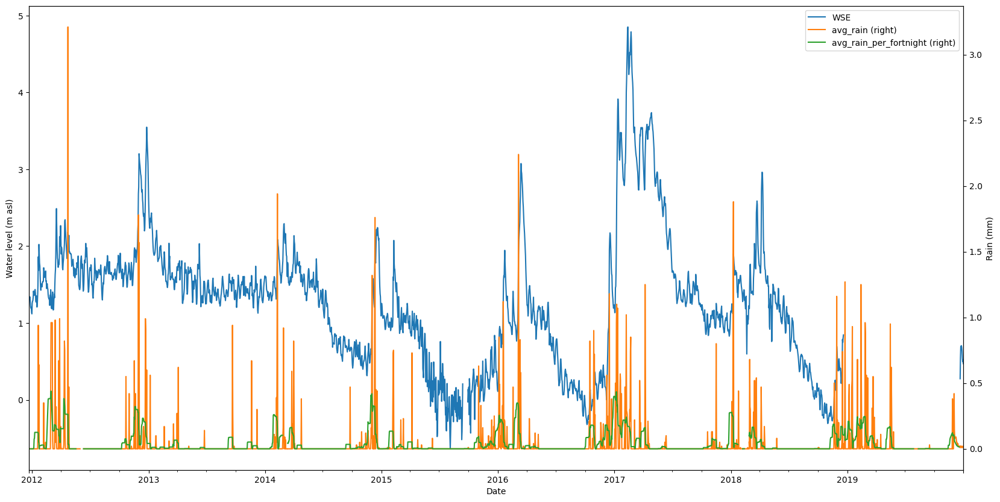

well code: 09N03E08C003M
closest rain gauges: OTFC1 YOLC1 SMF SAPC1
number of rainfall measurements: 176
time range of rainfall measurements (days): 7304
Most probable GW time lag from precipitation (in days) is 23


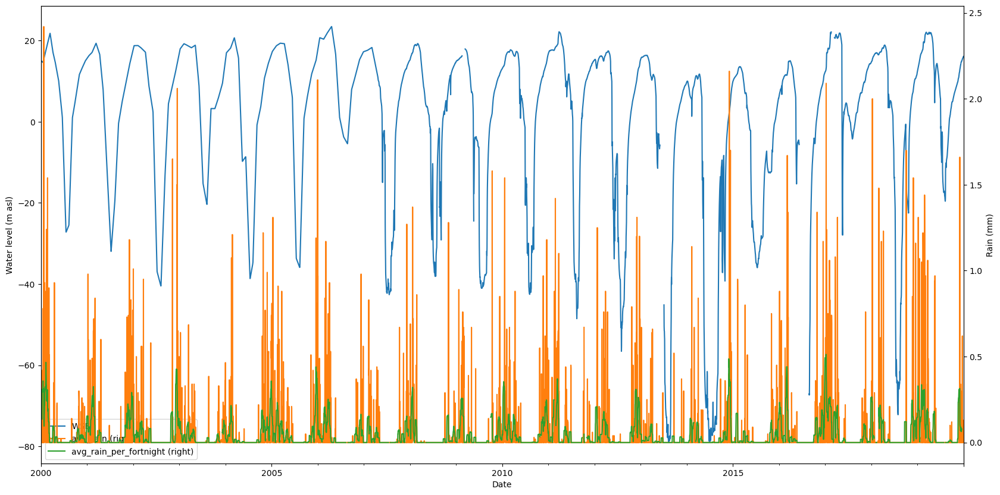

well code 19N01E35B001M has only 0 nearby rain data measurement[s]
well code: 17N02W09H003M
closest rain gauges: CLSC1 NWRC1 CLAC1 BTCC1
number of rainfall measurements: 204
time range of rainfall measurements (days): 5435
Most probable GW time lag from precipitation (in days) is 50


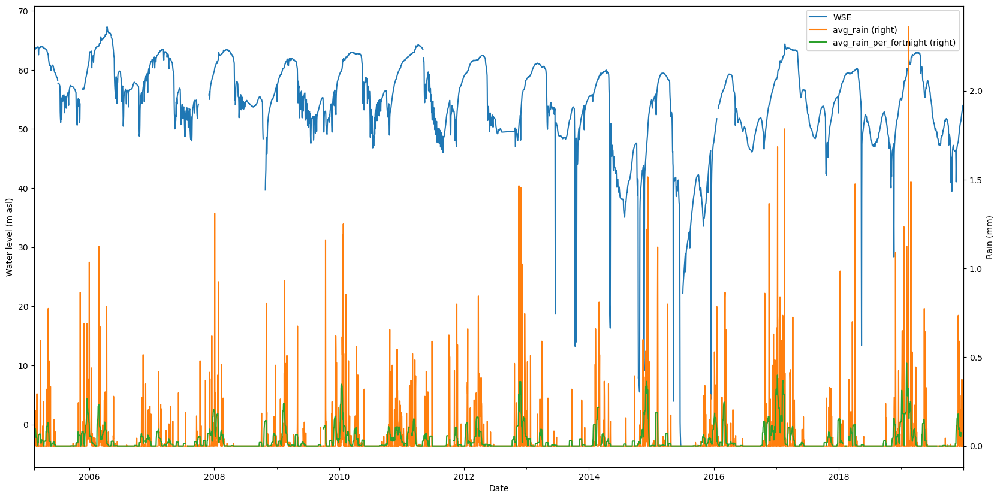

well code 17N01E24A003M has only 1 nearby rain data measurement[s]
well code 17N01E24A004M has only 1 nearby rain data measurement[s]
well code 17N01E24A005M has only 1 nearby rain data measurement[s]
well code 17N01E24A006M has only 1 nearby rain data measurement[s]
well code 16N03W14H003M has only 0 nearby rain data measurement[s]
well code 17N02E25J001M has only 1 nearby rain data measurement[s]
well code 17N02E25J002M has only 1 nearby rain data measurement[s]
well code 17N02E25J003M has only 1 nearby rain data measurement[s]
well code 17N01E17F002M has only 43 nearby rain data measurement[s]
well code 17N01E17F003M has only 43 nearby rain data measurement[s]
well code 01N04E36Q001M has only 0 nearby rain data measurement[s]
well code: 05N03E21H002M
closest rain gauges: SSZC1 LBIC1 CCSC1 GGSC1
number of rainfall measurements: 128
time range of rainfall measurements (days): 3253
Most probable GW time lag from precipitation (in days) is 12


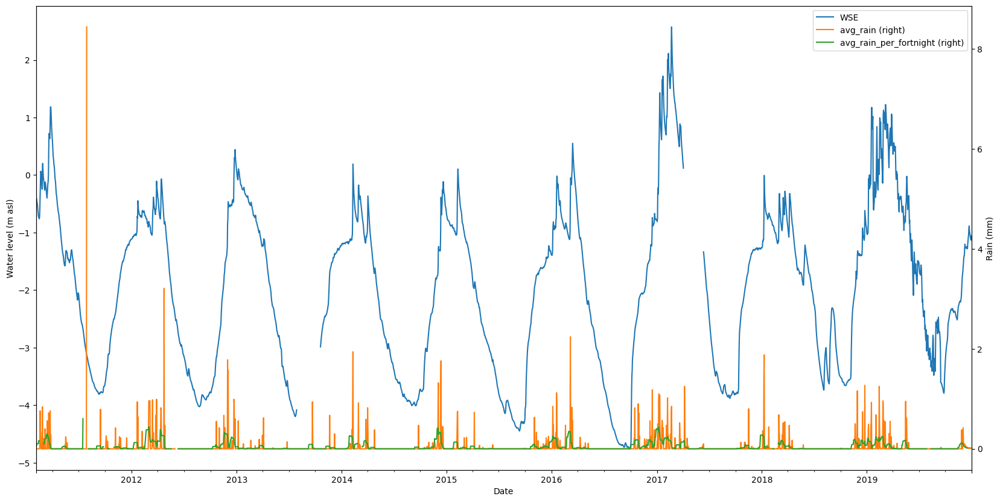

well code: 05N03E16J001M
closest rain gauges: SSZC1 LBIC1 CCSC1 GGSC1
number of rainfall measurements: 129
time range of rainfall measurements (days): 3463
Most probable GW time lag from precipitation (in days) is 28


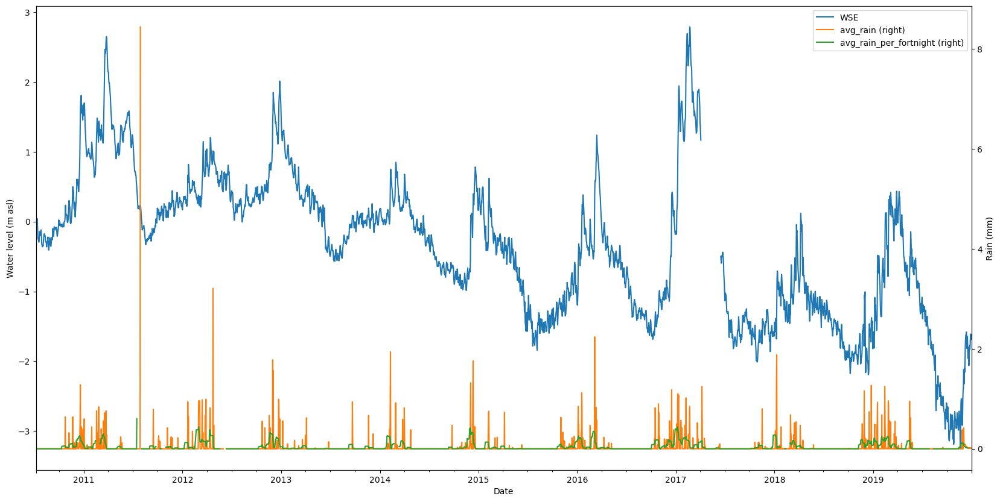

well code: 05N03E21H001M
closest rain gauges: SSZC1 LBIC1 CCSC1 GGSC1
number of rainfall measurements: 129
time range of rainfall measurements (days): 3463
Most probable GW time lag from precipitation (in days) is 10


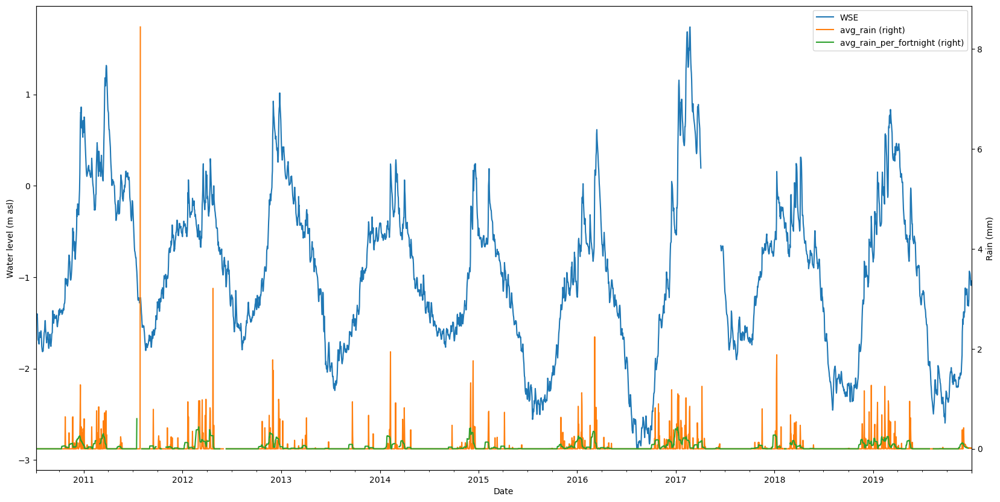

well code: 17N02W09H005M
closest rain gauges: CLSC1 NWRC1 CLAC1 BTCC1
number of rainfall measurements: 204
time range of rainfall measurements (days): 5435
Most probable GW time lag from precipitation (in days) is 47


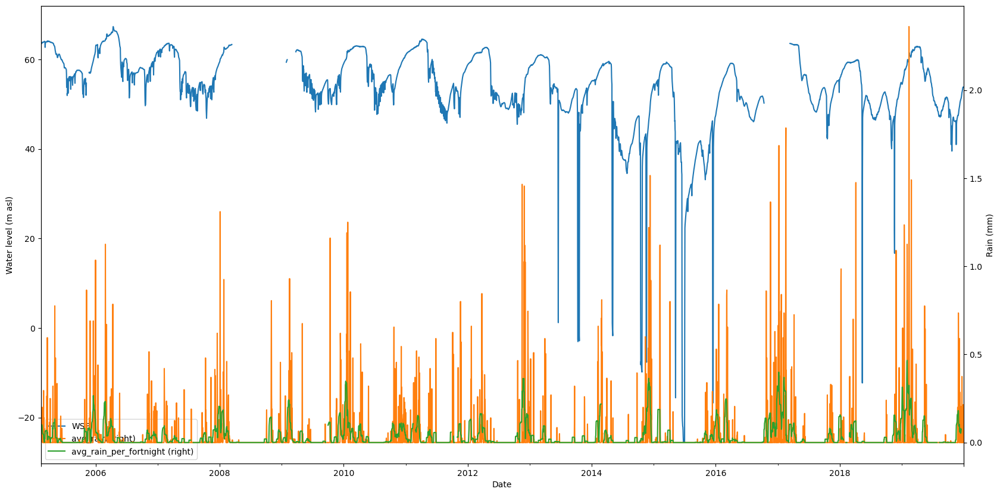

well code 18N01E21L001M has only 0 nearby rain data measurement[s]
well code 01S04E28P002M has only 0 nearby rain data measurement[s]
well code 01S04E28P004M has only 0 nearby rain data measurement[s]
well code 01N04E36Q002M has only 0 nearby rain data measurement[s]
well code 01N04E36Q003M has only 0 nearby rain data measurement[s]
well code 01N04E36Q004M has only 0 nearby rain data measurement[s]
well code 01S04E28F001M has only 0 nearby rain data measurement[s]
well code 01S04E28F002M has only 0 nearby rain data measurement[s]
well code 01S04E28P001M has only 0 nearby rain data measurement[s]
well code 01S04E28P003M has only 0 nearby rain data measurement[s]
well code 16N02W05B004M has only 45 nearby rain data measurement[s]
well code: 05N03E20B001M
closest rain gauges: SSZC1 LBIC1 CCSC1 GGSC1
number of rainfall measurements: 121
time range of rainfall measurements (days): 2647
Most probable GW time lag from precipitation (in days) is 15


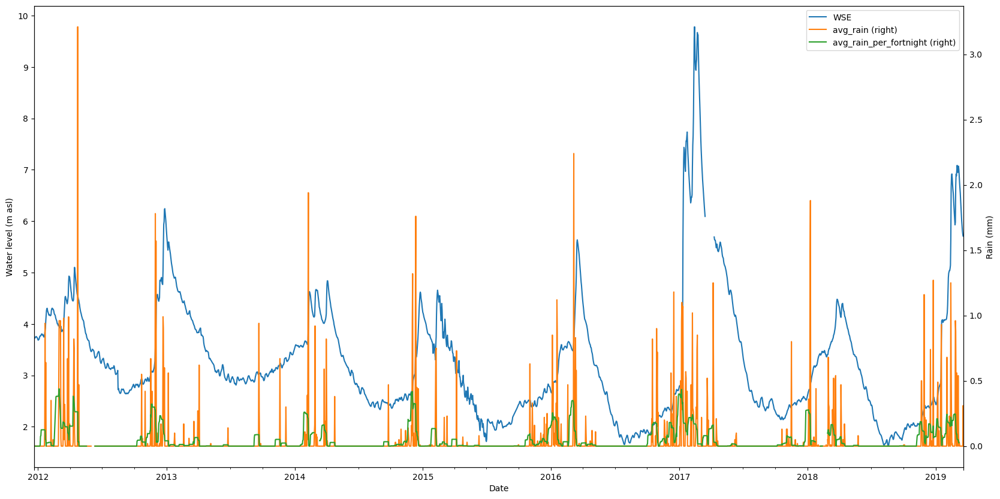

well code: 05N03E20B002M
closest rain gauges: SSZC1 LBIC1 CCSC1 GGSC1
number of rainfall measurements: 121
time range of rainfall measurements (days): 2647
Most probable GW time lag from precipitation (in days) is 38


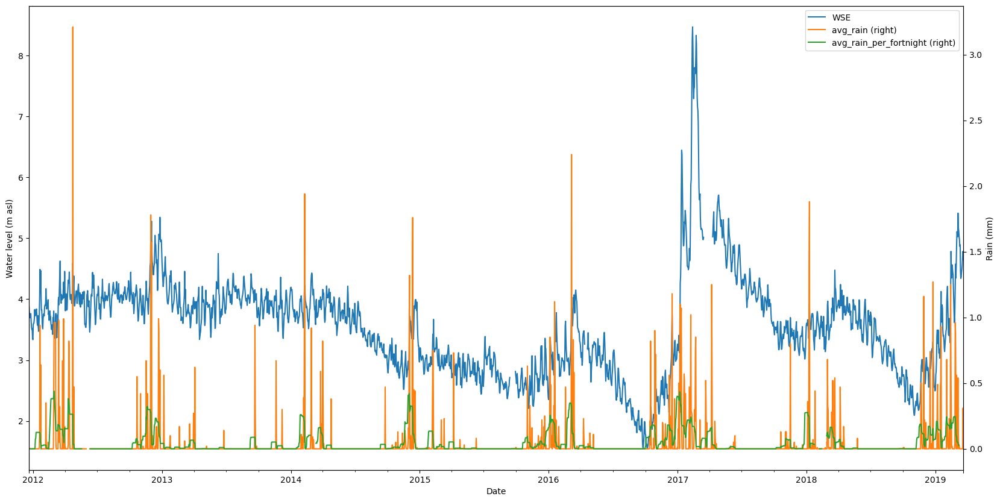

well code: 05N03E20B003M
closest rain gauges: SSZC1 LBIC1 CCSC1 GGSC1
number of rainfall measurements: 121
time range of rainfall measurements (days): 2647
Most probable GW time lag from precipitation (in days) is 11


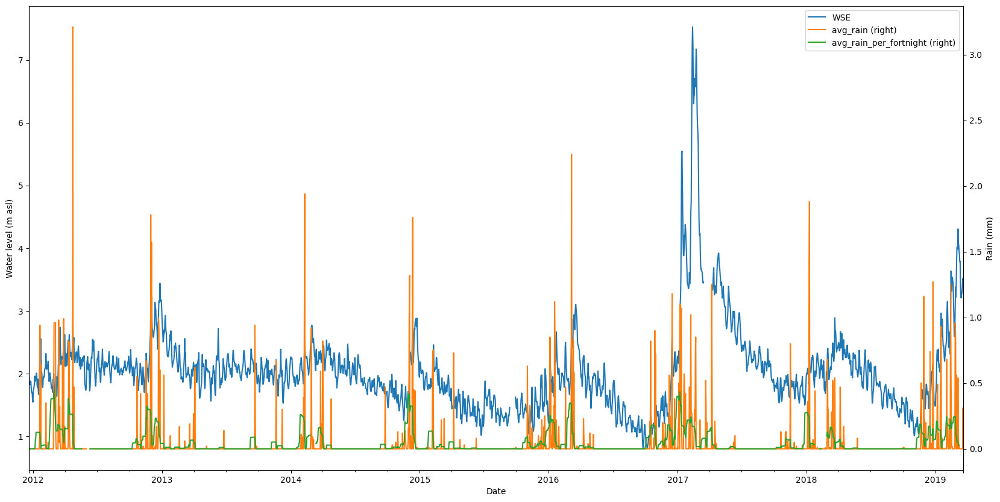

well code: 05N03E21G001M
closest rain gauges: SSZC1 LBIC1 CCSC1 GGSC1
number of rainfall measurements: 121
time range of rainfall measurements (days): 2645
Most probable GW time lag from precipitation (in days) is 50


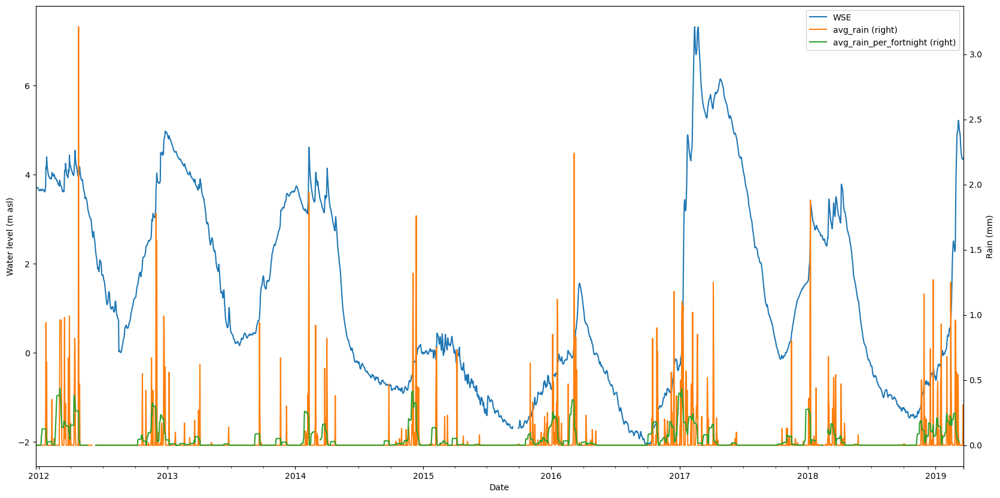

well code: 05N03E21G002M
closest rain gauges: SSZC1 LBIC1 CCSC1 GGSC1
number of rainfall measurements: 121
time range of rainfall measurements (days): 2645
Most probable GW time lag from precipitation (in days) is 10


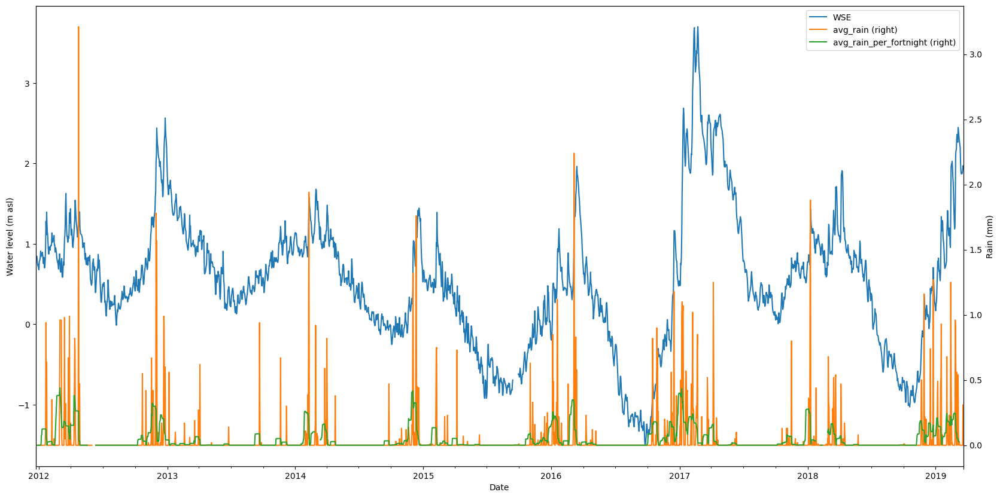

well code: 05N03E21G003M
closest rain gauges: SSZC1 LBIC1 CCSC1 GGSC1
number of rainfall measurements: 121
time range of rainfall measurements (days): 2645
Most probable GW time lag from precipitation (in days) is 12


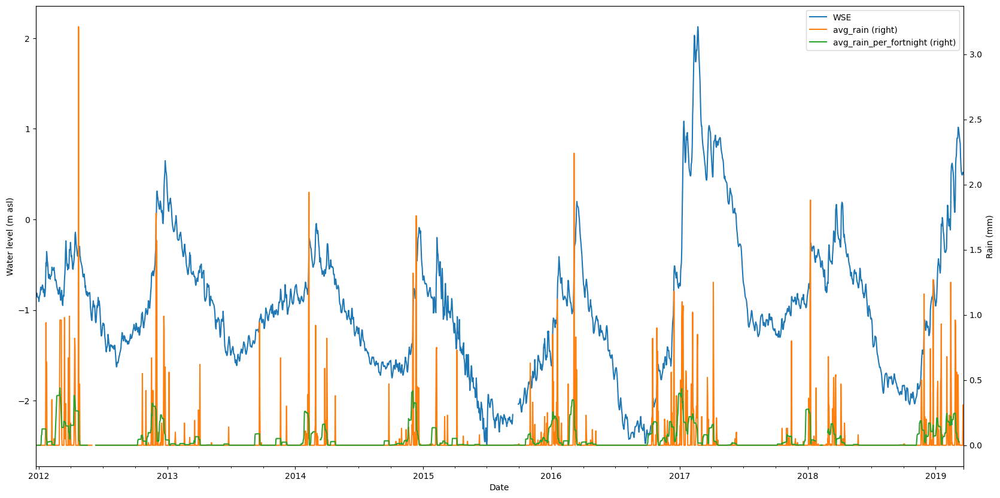

well code: 05N03E29C001M
closest rain gauges: SSZC1 CCSC1 LBIC1 RVBC1
number of rainfall measurements: 121
time range of rainfall measurements (days): 2647
Most probable GW time lag from precipitation (in days) is 31


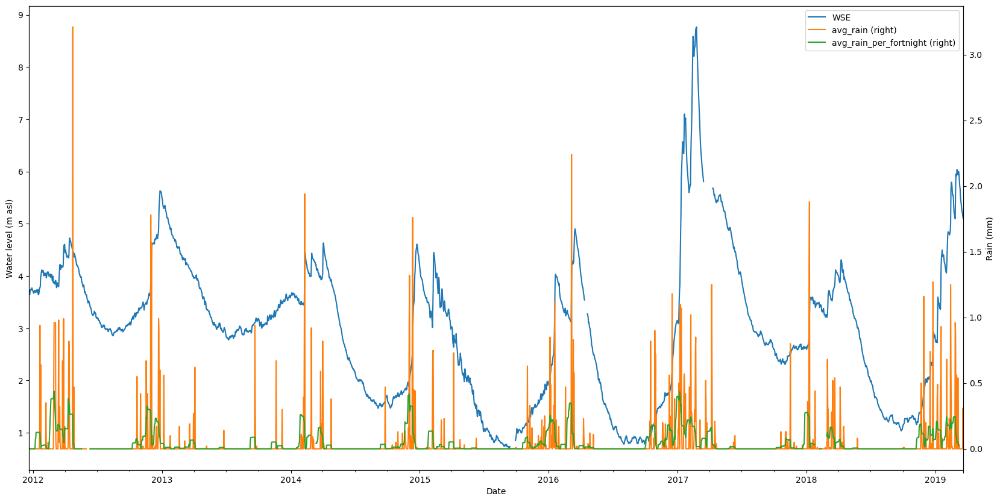

well code: 05N03E29C002M
closest rain gauges: SSZC1 CCSC1 LBIC1 RVBC1
number of rainfall measurements: 121
time range of rainfall measurements (days): 2647
Most probable GW time lag from precipitation (in days) is 9


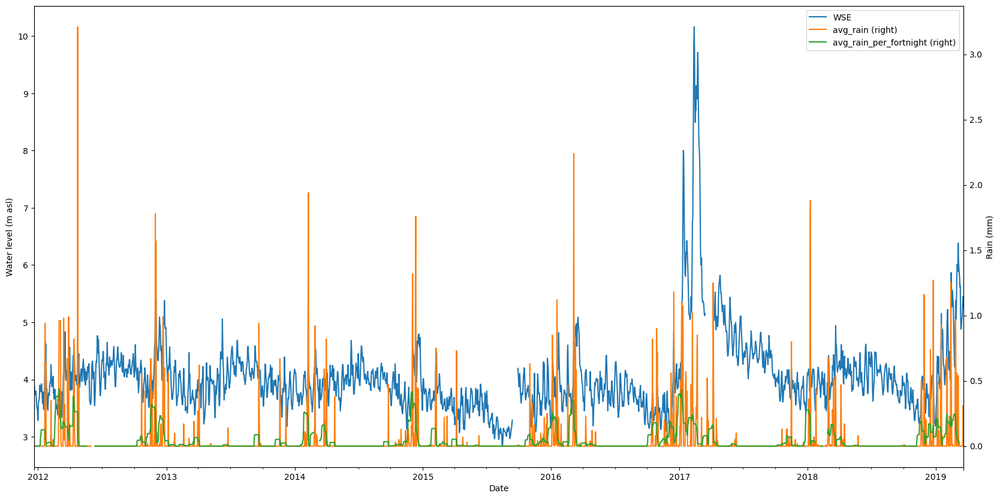

well code 01S04E28F004M has only 0 nearby rain data measurement[s]
well code 19N01W22D004M has only 0 nearby rain data measurement[s]
well code: 05N03E16R001M
closest rain gauges: SSZC1 LBIC1 CCSC1 GGSC1
number of rainfall measurements: 114
time range of rainfall measurements (days): 2462
Most probable GW time lag from precipitation (in days) is 11


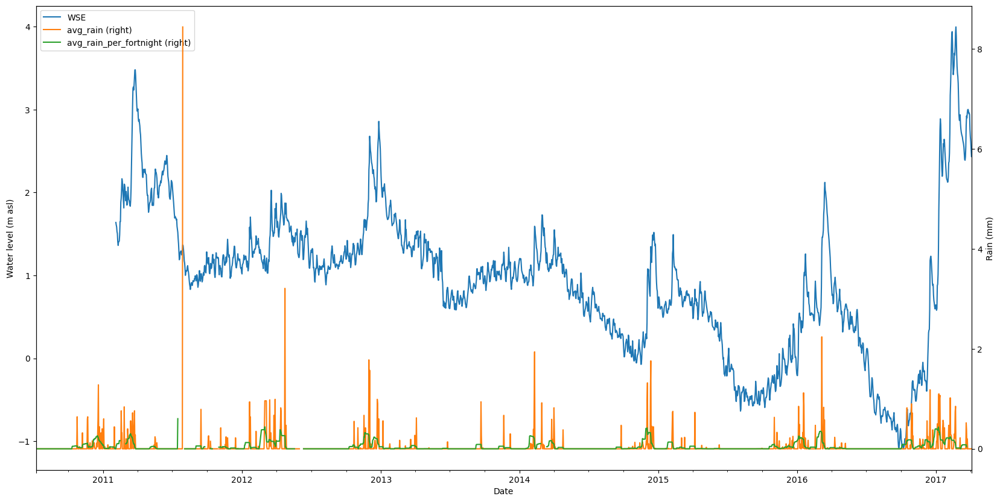

well code: 05N03E15F002M
closest rain gauges: SSZC1 LBIC1 CCSC1 GGSC1
number of rainfall measurements: 114
time range of rainfall measurements (days): 2495
Most probable GW time lag from precipitation (in days) is 11


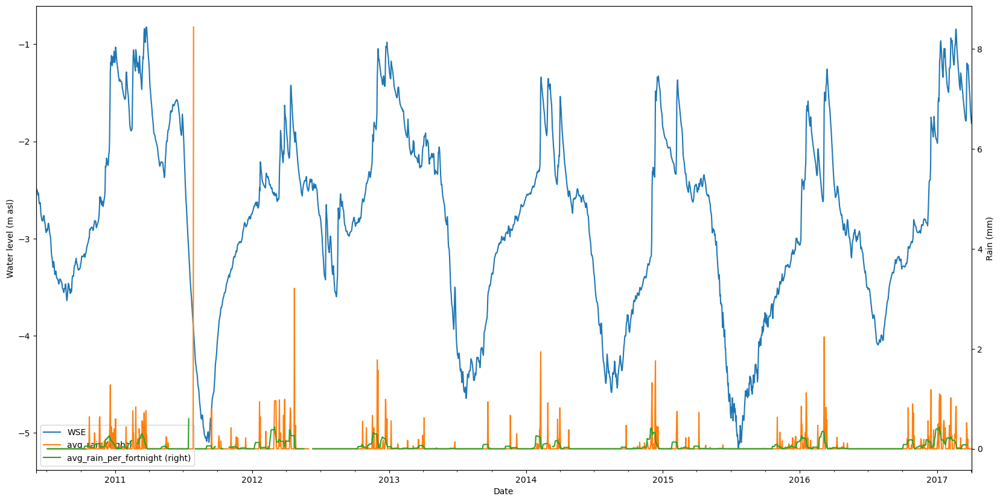

well code: 05N03E15P001M
closest rain gauges: SSZC1 LBIC1 CCSC1 GGSC1
number of rainfall measurements: 114
time range of rainfall measurements (days): 2495
Most probable GW time lag from precipitation (in days) is 11


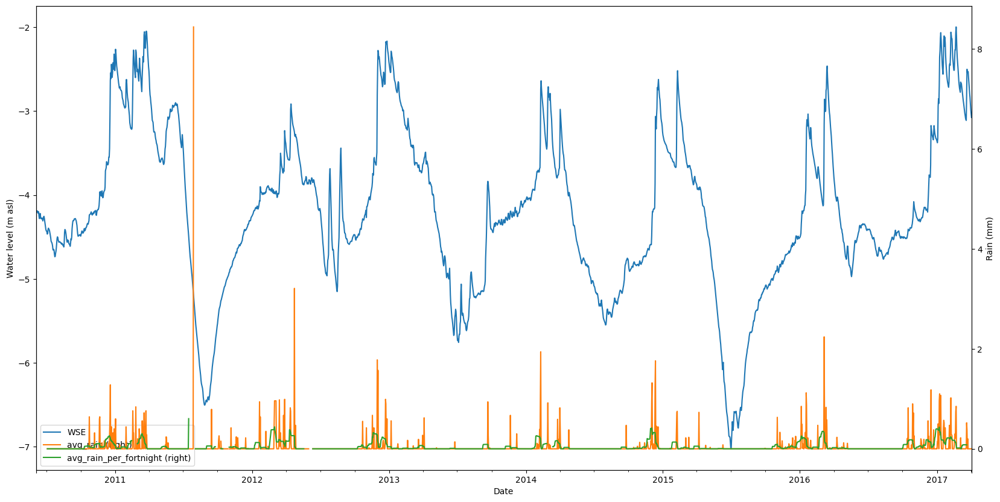

well code: 05N03E15P002M
closest rain gauges: SSZC1 LBIC1 CCSC1 GGSC1
number of rainfall measurements: 114
time range of rainfall measurements (days): 2495
Most probable GW time lag from precipitation (in days) is 11


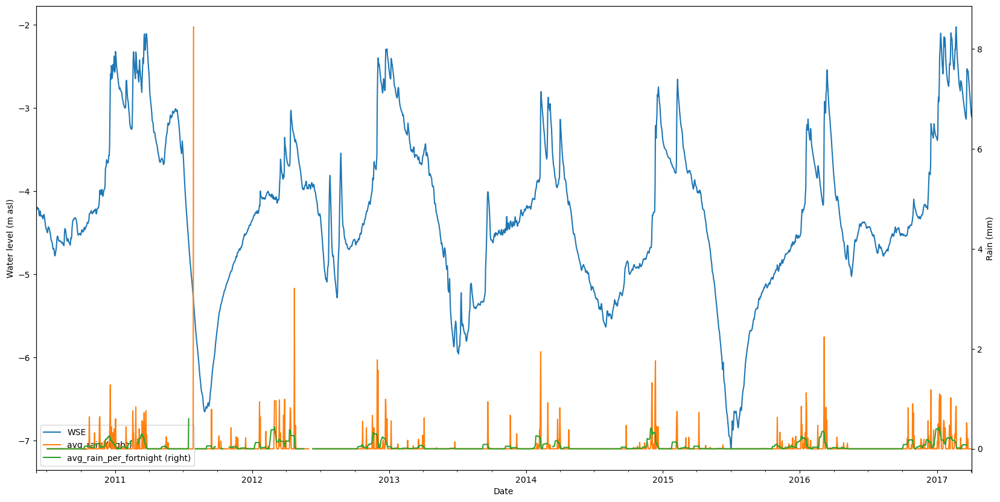

well code: 05N03E16J002M
closest rain gauges: SSZC1 LBIC1 CCSC1 GGSC1
number of rainfall measurements: 114
time range of rainfall measurements (days): 2461
Most probable GW time lag from precipitation (in days) is 11


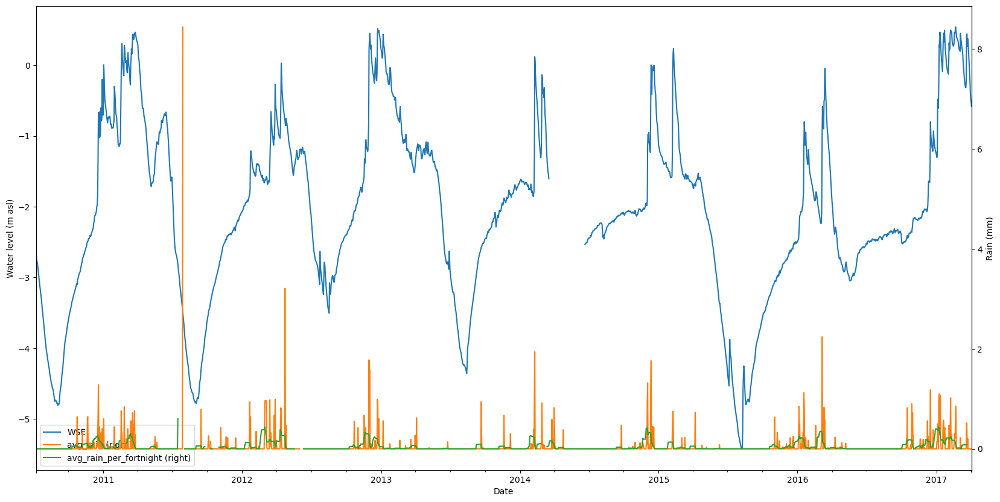

well code: 05N03E16R002M
closest rain gauges: SSZC1 LBIC1 CCSC1 GGSC1
number of rainfall measurements: 106
time range of rainfall measurements (days): 1916
Most probable GW time lag from precipitation (in days) is 11


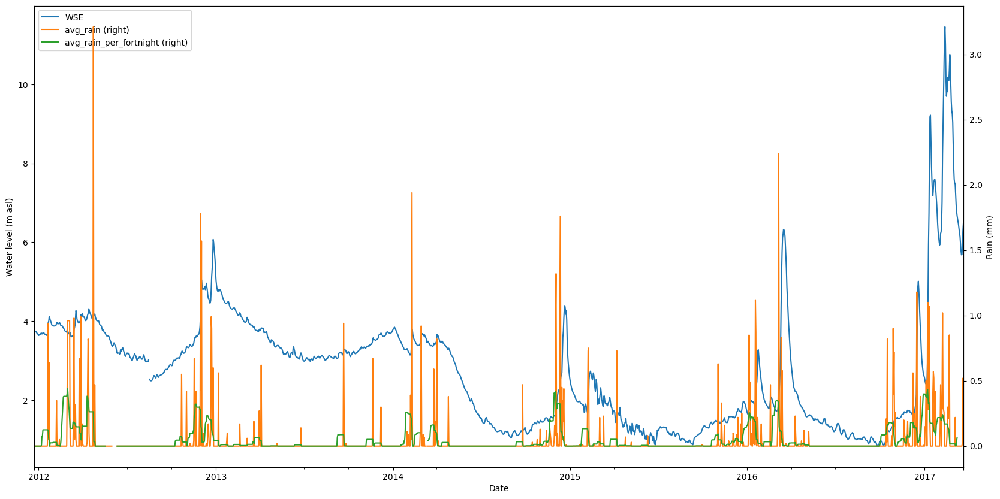

well code: 05N03E16R003M
closest rain gauges: SSZC1 LBIC1 CCSC1 GGSC1
number of rainfall measurements: 106
time range of rainfall measurements (days): 1916
Most probable GW time lag from precipitation (in days) is 13


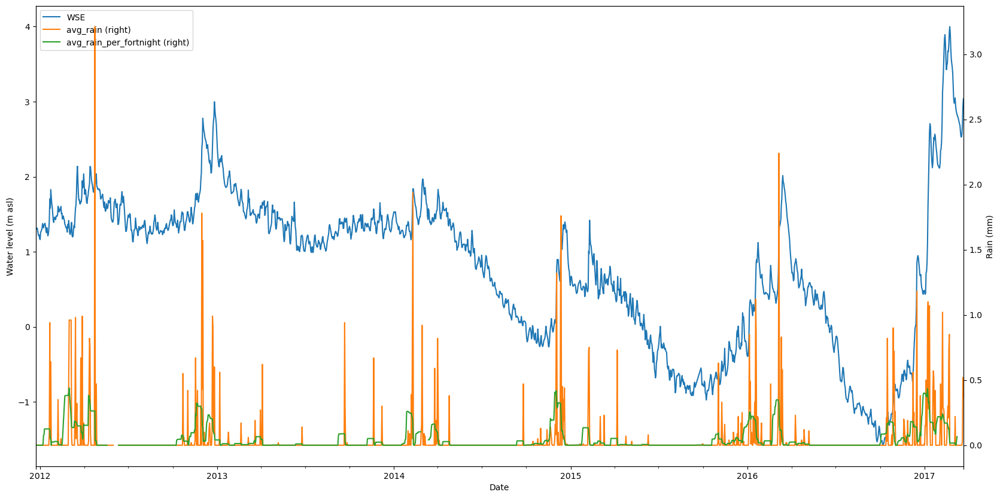

well code: 05N03E21L001M
closest rain gauges: SSZC1 LBIC1 CCSC1 GGSC1
number of rainfall measurements: 106
time range of rainfall measurements (days): 1916
Most probable GW time lag from precipitation (in days) is 8


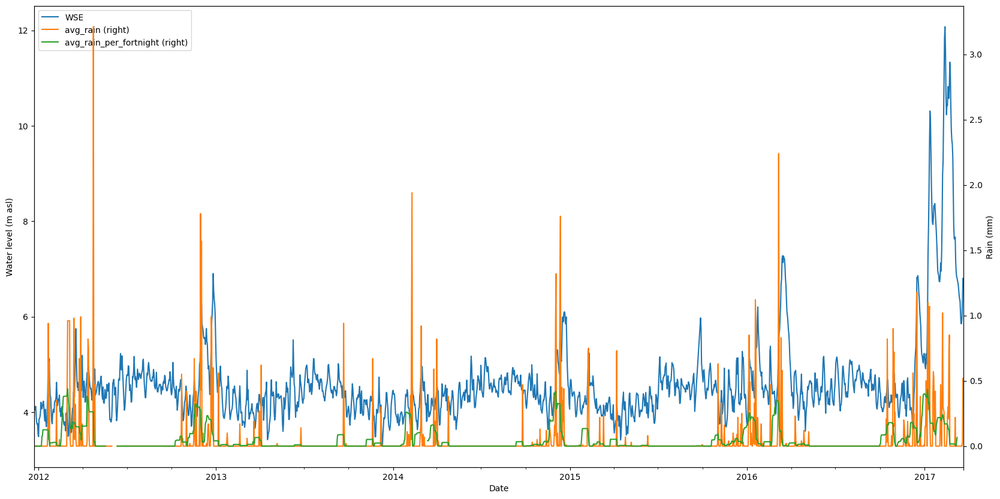

well code: 05N03E21L002M
closest rain gauges: SSZC1 LBIC1 CCSC1 GGSC1
number of rainfall measurements: 106
time range of rainfall measurements (days): 1916
Most probable GW time lag from precipitation (in days) is 9


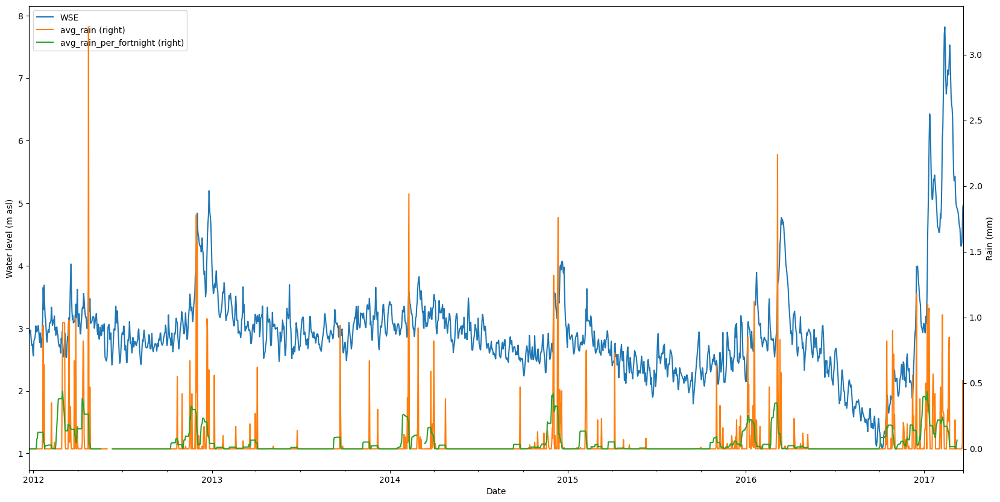

well code 01S06E29R001M has only 16 nearby rain data measurement[s]
well code 01S06E29R002M has only 16 nearby rain data measurement[s]
well code 01S06E29R003M has only 16 nearby rain data measurement[s]
well code 05N03E29A001M has only 70 nearby rain data measurement[s]
well code 05N03E29A002M has only 70 nearby rain data measurement[s]
well code 01S06E09E001M has only 92 nearby rain data measurement[s]
well code 01S06E09E002M has only 92 nearby rain data measurement[s]
well code 01S06E16D002M has only 92 nearby rain data measurement[s]
well code 01S06E16D003M has only 92 nearby rain data measurement[s]
well code 01S04E28F003M has only 0 nearby rain data measurement[s]
well code 05N03E15F001M has only 80 nearby rain data measurement[s]
well code 13N11W19H002M has only 0 nearby rain data measurement[s]
well code 13N11W17Q001M has only 0 nearby rain data measurement[s]
well code 13N11W19H001M has only 0 nearby rain data measurement[s]
well code 05N03E16A001M has only 20 nearby rain data

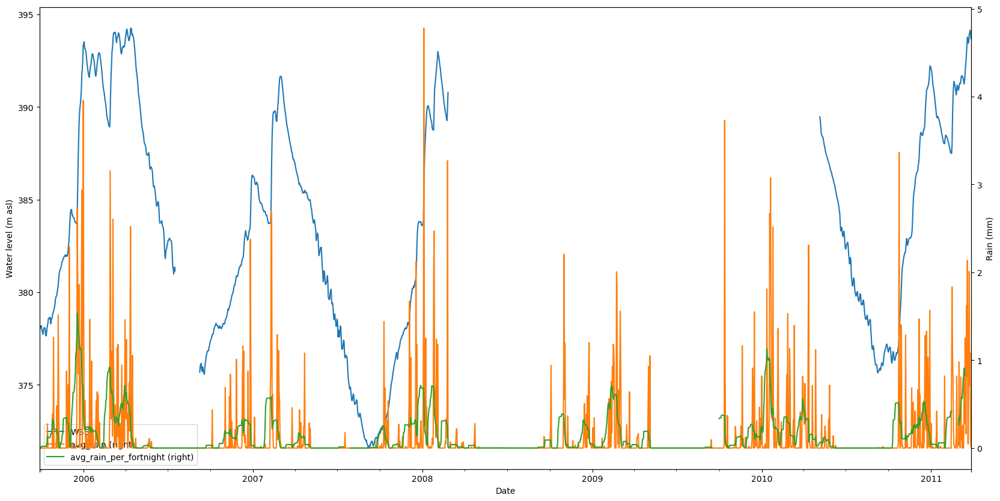

well code: 13N14W11B002M
closest rain gauges: BNVC1 PNTC1 UKIC1 YRKC1
number of rainfall measurements: 239
time range of rainfall measurements (days): 1915
Most probable GW time lag from precipitation (in days) is 17


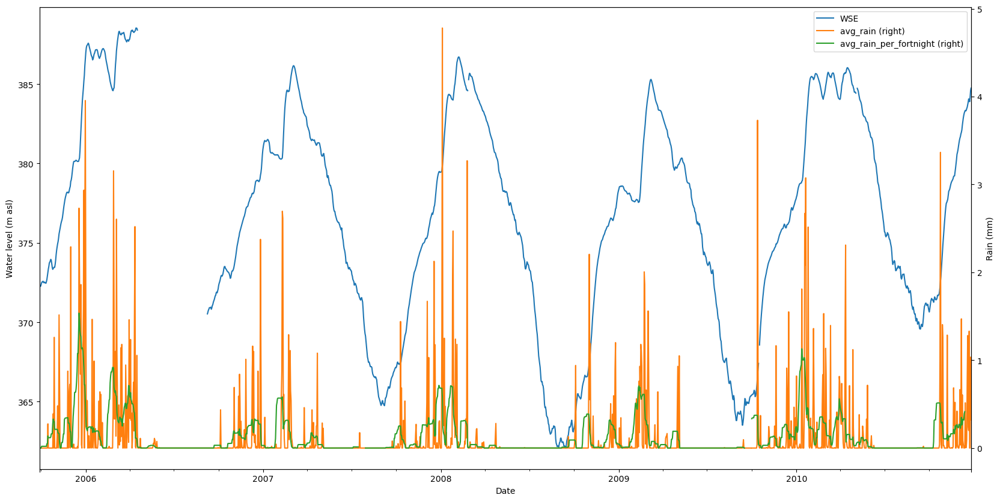

well code 11N01E02D002M has only 1 nearby rain data measurement[s]
well code 11N01E02D003M has only 1 nearby rain data measurement[s]
well code 11N02E05F001M has only 1 nearby rain data measurement[s]
well code 12N02E33P003M has only 1 nearby rain data measurement[s]
well code 09N07E02G001M has only 0 nearby rain data measurement[s]
well code 10N08E29J001M has only 0 nearby rain data measurement[s]
well code 11N02E05C002M has only 1 nearby rain data measurement[s]
well code 16N03E36M001M has only 1 nearby rain data measurement[s]
the total number of useful charts is 59
the total number of discarded charts is 172


In [70]:

import scipy


import warnings
warnings.filterwarnings('ignore')

suitablewells=[]
suitablewells_corr=[]
suitablewells_str=[]
counter=0
for indwell in well_plot_list:
    indwelldata = well_data_shortlist_rain[ well_data_shortlist_rain['well'] == indwell]
    ind_measurements= (indwelldata['First_rain'].nunique())+(indwelldata['Second_rain'].nunique())+(indwelldata['Third_rain'].nunique())+(indwelldata['Fourth_rain'].nunique())
    indwelldata['avg_rain'] = indwelldata[['First_rain','Second_rain','Third_rain','Fourth_rain']].mean(axis=1)
    indwelldata['avg_rain_per_fortnight'] = indwelldata['avg_rain'].rolling(14).mean()
    indwelldata['avg_WL_per_fortnight'] = indwelldata['WSE'].rolling(14).mean()
    timerange=(indwelldata['Date'].max()- indwelldata['Date'].min()).days
    

    if ind_measurements > 100:
        if timerange > 200:
            print("well code:",indwell)
            print("closest rain gauges:", indwelldata['First'].iloc[0],indwelldata['Second'].iloc[0],indwelldata['Third'].iloc[0],indwelldata['Fourth'].iloc[0])    
            print("number of rainfall measurements:", ind_measurements)
            print("time range of rainfall measurements (days):",timerange)
            rain_input = indwelldata['avg_rain_per_fortnight']
            WL_input = indwelldata['avg_WL_per_fortnight']
            correlation_well_test = [rainWLcorr(rain_input, WL_input, timelag=i) for i in range(180)]
            correlation_well_test_srs = pd.Series(correlation_well_test)
            print("Most probable GW time lag from precipitation (in days) is", correlation_well_test_srs.idxmax())                                                          
            counter=counter+1
            suitablewells.append(indwell)
            suitablewells_corr.append(correlation_well_test_srs.idxmax())
            suitablewells_str.append(correlation_well_test_srs.max())
            fig, ax = plot.subplots(figsize=(20,10)) 
            indwelldata.plot(x = 'Date', y = 'WSE', ax = ax) 
            indwelldata.plot(x = 'Date', y = ['avg_rain','avg_rain_per_fortnight'], ylabel='Rain (mm)',ax=ax,secondary_y = True)
            ax.yaxis.set_label_position("left")
            ax.set_ylabel("Water level (m asl)")
            plot.show()
        else:
            print("well code",indwell,"has only",timerange,"days of nearby rain data") 
    else:
        print("well code",indwell,"has only",ind_measurements,"nearby rain data measurement[s]")
        
        
print("the total number of useful (charted) wells is",counter)
print("the total number of discarded wells is",len(well_plot_list) - counter)

In [71]:
# Weak correlations (<0.30) should probably be excluded.

suitablewellsdf = pd.DataFrame(np.column_stack([suitablewells,suitablewells_corr,suitablewells_str]), 
columns=['STATION',
'estimated_time_lag','correlation_strength'])

suitablewellsdf=suitablewellsdf.sort_values('correlation_strength')

print(suitablewellsdf)


# To do: correlation strength, check against well depth 

suitablewellsdf.info()

          STATION estimated_time_lag  correlation_strength
22  18N02W18D001M                177  0.042098763954942074
12  10N04E27R004M                150   0.18569828558065088
13  10N04E31M001M                129    0.2588031931889237
23  18N02W18D002M                 87    0.2823622671449137
24  18N02W18D003M                 55   0.32034149900266834
41  05N03E20B002M                 38   0.32328144401142817
17  13N04E11J001M                 23   0.32625855751492067
2   14N03E23D005M                 50   0.32997272313622883
4   07N02E35D001M                 94   0.33279245849725686
39  17N02W09H005M                 47   0.33477915708634864
3   14N03E23D006M                 57    0.3359776501577129
19  13N04E11R003M                 27   0.34793910742694656
26  17N02W09H002M                 53   0.35079882877979857
32  05N03E16H001M                 70   0.35858057924689973
18  13N04E11R002M                 71   0.36038194546488317
11  10N04E27R003M                 38    0.36529517337530

<Axes: xlabel='Number of days', ylabel='Frequency'>

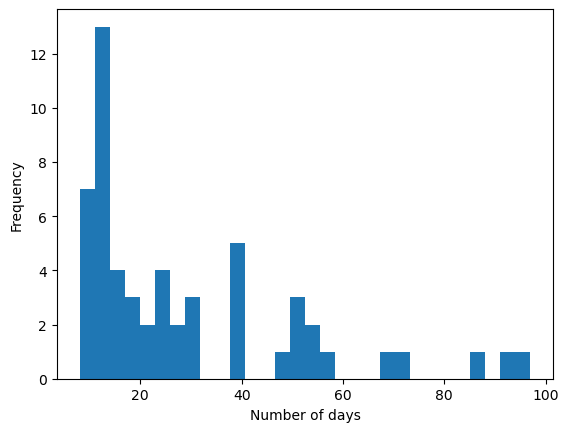

In [79]:
# Exclude wells with correlation strength <0.3


suitablewellsdf['correlation_strength'] = pd.to_numeric(suitablewellsdf['correlation_strength'])

suitablewellsdf['estimated_time_lag'] = pd.to_numeric(suitablewellsdf['estimated_time_lag'])

suitablewellsdf_best = suitablewellsdf.loc[suitablewellsdf['correlation_strength'] > 0.3]

#print(suitablewellsdf_best)


#Depict lag times as a histogram.
plot.xlabel("Number of days")
suitablewellsdf_best['estimated_time_lag'].plot.hist(bins=30)

In [73]:

# Estimate correlation of lag time with well depth.

suitablewellsdf_best


suitablewellsdf_best_wd = pd.merge(
    suitablewellsdf_best,
    gw_well_metadata,
    how="left",
    on='STATION',
    left_on=None,
    right_on=None,
)


0.4502864165439654

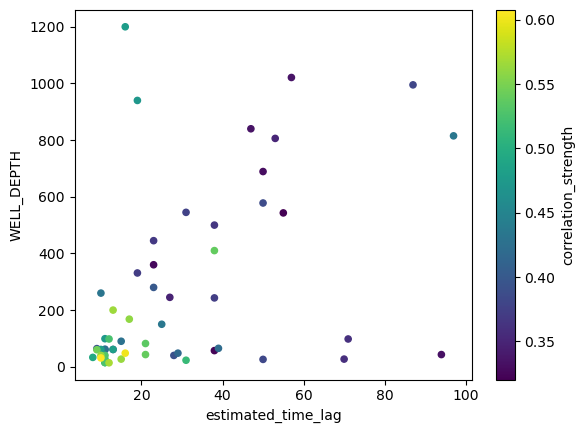

In [80]:
ax = suitablewellsdf_best_wd.plot.scatter(x='estimated_time_lag',
                      y='WELL_DEPTH',
                       c='correlation_strength',
                       colormap='viridis')


suitablewellsdf_best_wd['estimated_time_lag'].corr(suitablewellsdf_best_wd['WELL_DEPTH'])



Scatter plot of depth and estimated time-lag.



In [75]:
#Check latitude and longitude range of selected wells
print(suitablewellsdf_best_wd['LATITUDE'].max(),
suitablewellsdf_best_wd['LATITUDE'].min(),
suitablewellsdf_best_wd['LONGITUDE'].max(),
suitablewellsdf_best_wd['LONGITUDE'].min())

39.420773 38.25323585 -121.488 -123.3685


In [76]:
# Add city positions
os.listdir()

cities = pd.read_csv('uscities.csv', delimiter = ",")


print(cities.columns)

Index(['city', 'city_ascii', 'state_id', 'state_name', 'county_fips',
       'county_name', 'lat', 'lng', 'population', 'density', 'source',
       'military', 'incorporated', 'timezone', 'ranking', 'zips', 'id'],
      dtype='object')


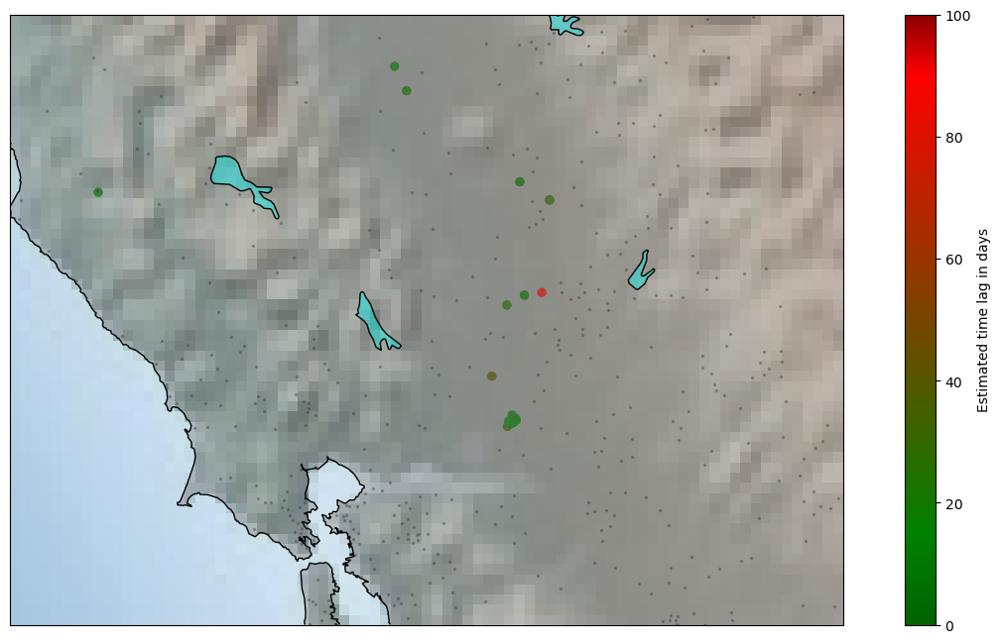

In [77]:
#Plot the wells and their estimated time-lags from precipitation on a map of California
#Green wells are fast to recharge from rainfall and red wells are slower.




import mpl_toolkits

from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plot

from matplotlib.pyplot import figure



from  matplotlib.colors import LinearSegmentedColormap

fig = plot.figure(figsize=(16, 8))


m = Basemap(width=300000,height=220000,projection='lcc',
            resolution='h',lat_1=37.8,lat_2=39.45,lat_0=38.6,lon_0=-122.)
m.shadedrelief()
c = ["darkgreen","green","red","darkred"]
v = [0,.15,.9,1.]
l = list(zip(v,c))
lat = suitablewellsdf_best_wd['LATITUDE'].values
lon = suitablewellsdf_best_wd['LONGITUDE'].values
time_lag = suitablewellsdf_best_wd['estimated_time_lag'].values

m.scatter(lon, lat, latlon=True,s=30,
          c=time_lag,
          cmap=LinearSegmentedColormap.from_list('rg',l, N=256), alpha=1)
m.drawcoastlines()

plot.colorbar(label=r'Estimated time lag in days')
plot.clim(0, 100)

citlat = cities['lat'].values
citlon = cities['lng'].values

# colorbar and legend

m.scatter(citlon, citlat, latlon=True,s=2, alpha=0.3,color='black')

m.fillcontinents(color='gray',lake_color='cyan',alpha=0.4)





plot.show()



### Conclusions

The basis of the project, that it should be possible to filter and process large quantities of groundwater and rainfall data using Python, and produce hydrogeologically relevant information in the form of estimates for lag time, has been demonstrated. 


### Improvements

A further investigation might consider using similar methods to look at the relative scale of rainfall events and the corresponding groundwater rises, as this too indicates significant things about the local aquifer and the rate of infiltration.

### Acknowledgements

Would like to acknowledge both Kaggle and NCAR/EOL (under the sponsorship of the National Science Foundation)
    
    